In [1]:
#importing the necessary packages
import pandas as pd
import string
import plotly.express as px
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
import matplotlib.style

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from scipy.stats import zscore
import statsmodels.formula.api as smf
from statsmodels.compat import lzip
import statsmodels.api as sm
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.preprocessing import StandardScaler


warnings.filterwarnings("ignore")
%matplotlib inline


In [2]:
print('Numpy Version',np.__version__)
print('Pandas Version',pd.__version__)
print('Seaborn Version',sns.__version__)
 

Numpy Version 1.24.3
Pandas Version 2.0.3
Seaborn Version 0.13.2


## Read & Load Data


In [3]:
# import os
# os.chdir("\\Users\mohin\Desktop\Data.csv")
df= pd.read_csv("\\Users\mohin\Desktop\Data.csv")


In [4]:
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,...,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,...,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,...,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,...,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,...,1,112,25.0,2009.0,18,0,C,6,24,24071


In [5]:
#display all columns

print(df.columns)
print(' ')
print("Total columns in train dataset = ", len(df.columns))

Index(['Ware_house_ID', 'WH_Manager_ID', 'Location_type', 'WH_capacity_size',
       'zone', 'WH_regional_zone', 'num_refill_req_l3m', 'transport_issue_l1y',
       'Competitor_in_mkt', 'retail_shop_num', 'wh_owner_type',
       'distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply',
       'dist_from_hub', 'workers_num', 'wh_est_year',
       'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'product_wg_ton'],
      dtype='object')
 
Total columns in train dataset =  24


In [6]:
## Checking the shape of the data: Number of columns and rows
df.shape

(25000, 24)

In [7]:
df.drop(columns=['Ware_house_ID', 'WH_Manager_ID'], inplace = True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Location_type                 25000 non-null  object 
 1   WH_capacity_size              25000 non-null  object 
 2   zone                          25000 non-null  object 
 3   WH_regional_zone              25000 non-null  object 
 4   num_refill_req_l3m            25000 non-null  int64  
 5   transport_issue_l1y           25000 non-null  int64  
 6   Competitor_in_mkt             25000 non-null  int64  
 7   retail_shop_num               25000 non-null  int64  
 8   wh_owner_type                 25000 non-null  object 
 9   distributor_num               25000 non-null  int64  
 10  flood_impacted                25000 non-null  int64  
 11  flood_proof                   25000 non-null  int64  
 12  electric_supply               25000 non-null  int64  
 13  d

In [9]:
df.isnull().sum()

Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
wh_owner_type                       0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                       990
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate      908
wh_breakdown_l3m                    0
govt_check_l3m                      0
product_wg_ton                      0
dtype: int64

In [10]:
#check duplicate rows and column
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 0
(25000, 22)


There is no duplicate rows and column in the this data so here we don't need to reemove duplicate rows and column.

In [11]:
unique_counts = []
for col in df.columns:
    unique_counts.append((col, df[col].nunique()))
unique_counts = sorted(unique_counts, key=lambda x: x[1],reverse = True)
print("No of unique values in each column are as follows:(In Descending order)\n")
for col,nunique in unique_counts:
    print(f"{col}: {nunique}: {round(nunique/25000*100,2)}%")

No of unique values in each column are as follows:(In Descending order)

retail_shop_num: 4906: 19.62%
product_wg_ton: 4561: 18.24%
dist_from_hub: 217: 0.87%
workers_num: 60: 0.24%
distributor_num: 56: 0.22%
storage_issue_reported_l3m: 37: 0.15%
govt_check_l3m: 32: 0.13%
wh_est_year: 28: 0.11%
Competitor_in_mkt: 12: 0.05%
num_refill_req_l3m: 9: 0.04%
wh_breakdown_l3m: 7: 0.03%
WH_regional_zone: 6: 0.02%
transport_issue_l1y: 6: 0.02%
approved_wh_govt_certificate: 5: 0.02%
zone: 4: 0.02%
WH_capacity_size: 3: 0.01%
Location_type: 2: 0.01%
wh_owner_type: 2: 0.01%
flood_impacted: 2: 0.01%
flood_proof: 2: 0.01%
electric_supply: 2: 0.01%
temp_reg_mach: 2: 0.01%


retail_shop_num: 4906: 19.62%
product_wg_ton: 4561: 18.24%
dist_from_hub: 217: 0.87%
workers_num: 60: 0.24%
distributor_num: 56: 0.22%
storage_issue_reported_l3m: 37: 0.15%
govt_check_l3m: 32: 0.13%
wh_est_year: 28: 0.11%

In [12]:
# display number of unique values in each column

df.nunique().sort_values(ascending=False)

retail_shop_num                 4906
product_wg_ton                  4561
dist_from_hub                    217
workers_num                       60
distributor_num                   56
storage_issue_reported_l3m        37
govt_check_l3m                    32
wh_est_year                       28
Competitor_in_mkt                 12
num_refill_req_l3m                 9
wh_breakdown_l3m                   7
transport_issue_l1y                6
WH_regional_zone                   6
approved_wh_govt_certificate       5
zone                               4
WH_capacity_size                   3
temp_reg_mach                      2
Location_type                      2
electric_supply                    2
flood_impacted                     2
wh_owner_type                      2
flood_proof                        2
dtype: int64

In [13]:
### Examine missing values
df_na= df.isna().sum()
df_na[df_na.values > 0].sort_values(ascending=False) # Find out all variables that contain missing values

wh_est_year                     11881
workers_num                       990
approved_wh_govt_certificate      908
dtype: int64

In [14]:
df.dtypes.value_counts()

int64      14
object      6
float64     2
Name: count, dtype: int64

In [15]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 0
(25000, 22)


In [16]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Location_type,25000,2,Rural,22957,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WH_capacity_size,25000,3,Large,10169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
zone,25000,4,North,10278,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WH_regional_zone,25000,6,Zone 6,8339,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_refill_req_l3m,25000.0,NaN,NaN,NaN,4.08904,2.606612,0.0,2.0,4.0,6.0,8.0
transport_issue_l1y,25000.0,NaN,NaN,NaN,0.77368,1.199449,0.0,0.0,0.0,1.0,5.0
Competitor_in_mkt,25000.0,NaN,NaN,NaN,3.1042,1.141663,0.0,2.0,3.0,4.0,12.0
retail_shop_num,25000.0,NaN,NaN,NaN,4985.71156,1052.825252,1821.0,4313.0,4859.0,5500.0,11008.0
wh_owner_type,25000,2,Company Owned,13578,NaN,NaN,NaN,NaN,NaN,NaN,NaN
distributor_num,25000.0,NaN,NaN,NaN,42.41812,16.064329,15.0,29.0,42.0,56.0,70.0


**Observations:**
*   Out of 11 different locations, We can see that more than 13%(790) of observations are located in "Mumbai".
*   No of kilometers driven ranges from 171 to 6.5 lakh kilometres with atleast 75% values less than 73000, indicating that there might be some outliers
*   Fuel type of more than 53%(3205) Engines is Diesel.
*   Approximately 70%(4299) of the cars are manual transmission cars.
*   Furthermore, we can see that about 81% of cars are "first owned" 
*   The min no of seats is 0 - indicating an error in our data, as a 'zero seater' car seems highly improbable to exist.
* Average no of seats in a car is 5 and the maximum number of seats are 10
*   We can also observe that Diesel engines are predominantly found in our dataset
*   Price of the car ranges from 44,000 to 1.6 Crores with atleast 75% values less than 9.95 lakhs - outlier indication again


Tweaking the Dataset to find more interesting patterns
We can see that Year is considered a continuous variable. Let's convert it to a categorical variable to get a better summary.
*As some of the cars are run on gas(CNG, LPG), We see that Mileage for those cars is recorded in "km/kg" where as petrol/diesel cars have their mileage in kmpl. Let's see if we can convert km/kg into kmpl and find anything interesting after we make it a numerical value.*
Although we have only 824 non null observations in the New Price column, they're currently in string format. Let's see if we can convert them to numbers and derive any interesting value out of that.
Although 'Mahindra XUV500 W8 2WD' is the car with most no of sales, it's not so significant as it is less than 1%(49) of total sales.
So, from the 'Name' variable, we can try to derive the Manufacturer of each car i.e., the brand name and pursue deeper.

In [17]:
## display two sample rows of columns with int dtype
df.select_dtypes(include='int64').sample(2).T

,4867,24851
num_refill_req_l3m,6,3
transport_issue_l1y,0,0
Competitor_in_mkt,2,2
retail_shop_num,4729,4574
distributor_num,59,38
flood_impacted,1,1
flood_proof,0,0
electric_supply,0,1
dist_from_hub,90,192
storage_issue_reported_l3m,13,36


In [18]:
## display two sample rows of columns with object dtype
df.select_dtypes(include='float').sample(2).T

,19222,7006
workers_num,33.0,26.0
wh_est_year,NaN,2013.0


In [19]:
## display two sample rows of columns with int dtype
df.select_dtypes(include='object').sample(2).T

,6289,11364
Location_type,Rural,Rural
WH_capacity_size,Small,Large
zone,North,South
WH_regional_zone,Zone 1,Zone 5
wh_owner_type,Company Owned,Company Owned
approved_wh_govt_certificate,C,B+


In [20]:
print('Percent of Total Missing Values in the data =' ,(df.isna().sum().sum()*100/df.size).round(2), "%")

Percent of Total Missing Values in the data = 2.51 %


In [21]:
missing_values = [feature for feature in df.columns if df[feature].isnull().sum() > 1]

for feature in missing_values:
  print(f"{feature} {np.round(df[feature].isnull().mean(), 4)}% missing values")

workers_num 0.0396% missing values
wh_est_year 0.4752% missing values
approved_wh_govt_certificate 0.0363% missing values


In [22]:
for col in df.columns:
    if df[col].isnull().sum()!=0:
        print(f"{col}: {df[col].isnull().sum()}: {round(df[col].isnull().mean()*100,2)}%")

workers_num: 990: 3.96%
wh_est_year: 11881: 47.52%
approved_wh_govt_certificate: 908: 3.63%


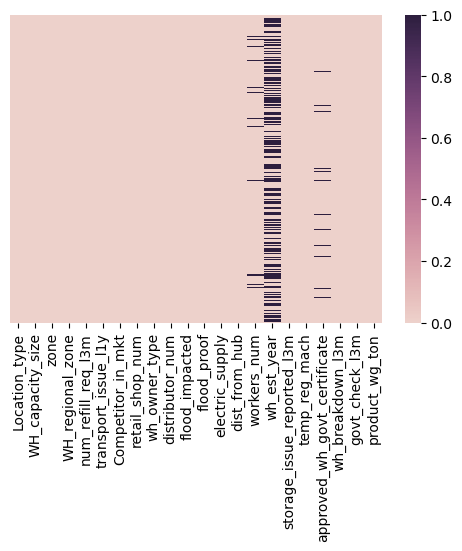

In [23]:
plt.figure(figsize=(6, 4))
sns.heatmap(df.isnull(), yticklabels=False, cmap=sns.cubehelix_palette(as_cmap=True))
plt.show()



In [24]:
# print percentage of null values in each column

null_values_features = [i for i in df.columns if df[i].isnull().sum()>1]
for i in null_values_features:
    print(i, np.round(df[i].isnull().mean()*100, 2), "% missing values")

workers_num 3.96 % missing values
wh_est_year 47.52 % missing values
approved_wh_govt_certificate 3.63 % missing values


In [25]:
# Replacing missing values with the median
df['workers_num'].fillna(df['workers_num'].median(), inplace=True)

# Replacing missing values with the median or mode
df['wh_est_year'].fillna(df['wh_est_year'].median(), inplace=True)

# Filling missing values with a default category or mode

df['approved_wh_govt_certificate'].fillna('NIL', inplace=True)
# Check for missing values
df.isnull().sum()

Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
wh_owner_type                   0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
wh_est_year                     0
storage_issue_reported_l3m      0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
product_wg_ton                  0
dtype: int64

In [26]:
pd.options.display.float_format = '{:.2f}'.format

In [27]:
df.describe(include='all')

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
count,25000,25000,25000,25000,25000.00,25000.00,25000.00,25000.00,25000,25000.00,...,25000.00,25000.00,25000.00,25000.00,25000.00,25000.00,25000,25000.00,25000.00,25000.00
unique,2,3,4,6,NaN,NaN,NaN,NaN,2,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,NaN,NaN
top,Rural,Large,North,Zone 6,NaN,NaN,NaN,NaN,Company Owned,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,C,NaN,NaN,NaN
freq,22957,10169,10278,8339,NaN,NaN,NaN,NaN,13578,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5501,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,4.09,0.77,3.10,4985.71,NaN,42.42,...,0.66,163.54,28.91,2009.20,17.13,0.30,NaN,3.48,18.81,22102.63
std,NaN,NaN,NaN,NaN,2.61,1.20,1.14,1052.83,NaN,16.06,...,0.47,62.72,7.72,5.46,9.16,0.46,NaN,1.69,8.63,11607.76
min,NaN,NaN,NaN,NaN,0.00,0.00,0.00,1821.00,NaN,15.00,...,0.00,55.00,10.00,1996.00,0.00,0.00,NaN,0.00,1.00,2065.00
25%,NaN,NaN,NaN,NaN,2.00,0.00,2.00,4313.00,NaN,29.00,...,0.00,109.00,24.00,2009.00,10.00,0.00,NaN,2.00,11.00,13059.00
50%,NaN,NaN,NaN,NaN,4.00,0.00,3.00,4859.00,NaN,42.00,...,1.00,164.00,28.00,2009.00,18.00,0.00,NaN,3.00,21.00,22101.00
75%,NaN,NaN,NaN,NaN,6.00,1.00,4.00,5500.00,NaN,56.00,...,1.00,218.00,33.00,2010.00,24.00,1.00,NaN,5.00,26.00,30103.00


### Univariate Analysis

In [28]:
numerical = ['num_refill_req_l3m','transport_issue_l1y','Competitor_in_mkt','retail_shop_num','distributor_num','flood_impacted','flood_proof','electric_supply','dist_from_hub',
'storage_issue_reported_l3m','temp_reg_mach','wh_breakdown_l3m','govt_check_l3m','product_wg_ton']
categorical = ['Location_type','WH_capacity_size','zone','WH_regional_zone','wh_owner_type',
'approved_wh_govt_certificate']

In [29]:
# Looking at the unique values of Categorical Features
print(df['Location_type'].unique())
print(df['WH_capacity_size'].unique())
print(df['zone'].unique())
print(df['WH_regional_zone'].unique())
print(df['wh_owner_type'].unique())
print(df['approved_wh_govt_certificate'].unique())


['Urban' 'Rural']
['Small' 'Large' 'Mid']
['West' 'North' 'South' 'East']
['Zone 6' 'Zone 5' 'Zone 2' 'Zone 3' 'Zone 1' 'Zone 4']
['Rented' 'Company Owned']
['A' 'A+' 'C' 'B' 'B+' 'NIL']


In [30]:
#This class is used to style our output in various formats 
class style:
#These are the ANSI escape sequences to set Graphics in our output
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   BLINK = '\033[5m'
   END = '\033[0m'

In [31]:
def univariate_analysis_categorical(cat, i):
    print(f"\t\t{style.BOLD}Univariate Analysis of {cat}")
    print(f"-----------------------------------------------------------{style.END}")
    print(f"{i+1}. No of unique values in {style.BOLD}{cat}{style.END} are: {df[cat].nunique()}. \nThe distribution is as follows:")
    print(f"{style.BOLD}{cat}{style.END}\n{df[cat].value_counts()}\n")
    vc = df[cat].value_counts()
    if len(vc.index)<=5:
        g = sns.countplot(x=cat, data=df, palette = 'pastel', order = df[cat].value_counts().index)
    elif len(vc.index)>5 and len(vc.index)<=15:
        g = sns.countplot(y=cat, data=df, palette = 'pastel', order = df[cat].value_counts().index)
    elif len(vc.index)>15:
        g = sns.countplot(x=cat, data=df, palette = 'pastel',order = df[cat].value_counts().index)
        g.set_xticklabels(labels = g.get_xticklabels(), rotation = 90)
    plt.show()

		Univariate Analysis of WH_capacity_size
-----------------------------------------------------------
2. No of unique values in WH_capacity_size are: 3. 
The distribution is as follows:
WH_capacity_size
WH_capacity_size
Large    10169
Mid      10020
Small     4811
Name: count, dtype: int64



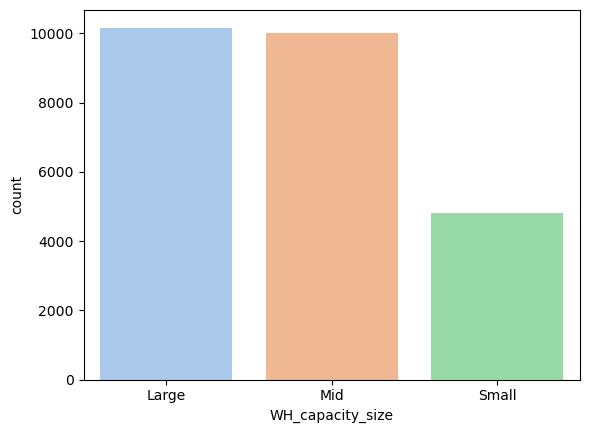

		Univariate Analysis of zone
-----------------------------------------------------------
3. No of unique values in zone are: 4. 
The distribution is as follows:
zone
zone
North    10278
West      7931
South     6362
East       429
Name: count, dtype: int64



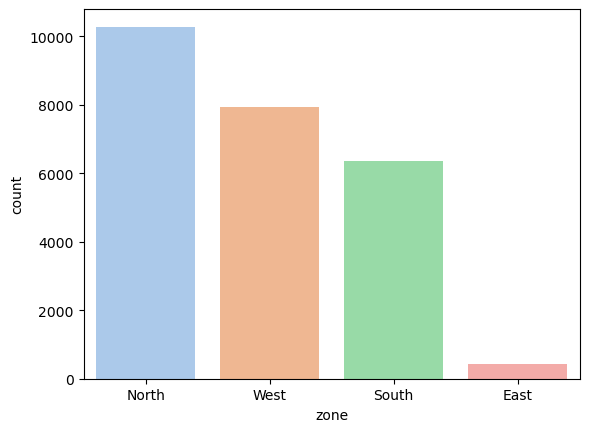

		Univariate Analysis of WH_regional_zone
-----------------------------------------------------------
4. No of unique values in WH_regional_zone are: 6. 
The distribution is as follows:
WH_regional_zone
WH_regional_zone
Zone 6    8339
Zone 5    4587
Zone 4    4176
Zone 2    2963
Zone 3    2881
Zone 1    2054
Name: count, dtype: int64



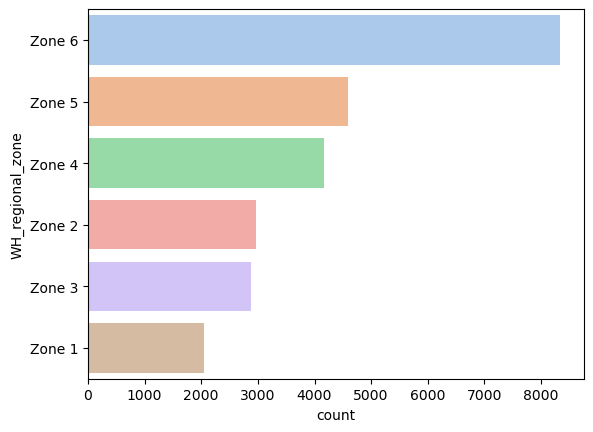

		Univariate Analysis of wh_owner_type
-----------------------------------------------------------
5. No of unique values in wh_owner_type are: 2. 
The distribution is as follows:
wh_owner_type
wh_owner_type
Company Owned    13578
Rented           11422
Name: count, dtype: int64



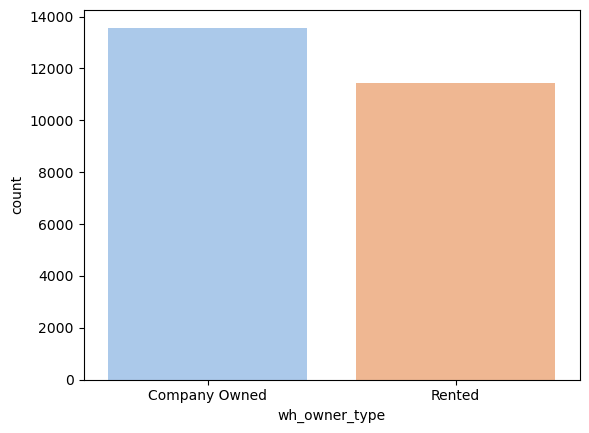

		Univariate Analysis of approved_wh_govt_certificate
-----------------------------------------------------------
6. No of unique values in approved_wh_govt_certificate are: 6. 
The distribution is as follows:
approved_wh_govt_certificate
approved_wh_govt_certificate
C      5501
B+     4917
B      4812
A      4671
A+     4191
NIL     908
Name: count, dtype: int64



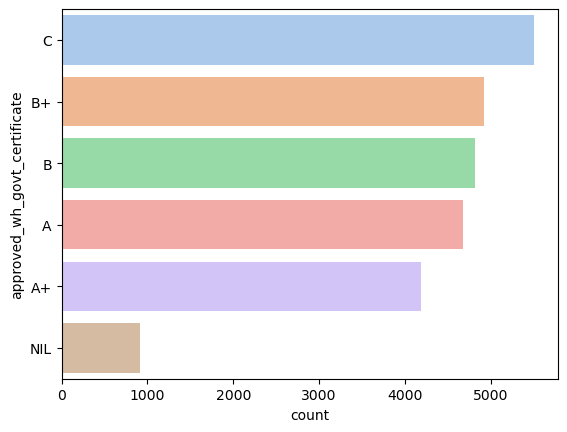

In [32]:
for i,x in enumerate(categorical):
    if x not in ['Location_type']:
        univariate_analysis_categorical(x, i)
        


### Observations

### Analyzing the Continuous(numerical) Variables 

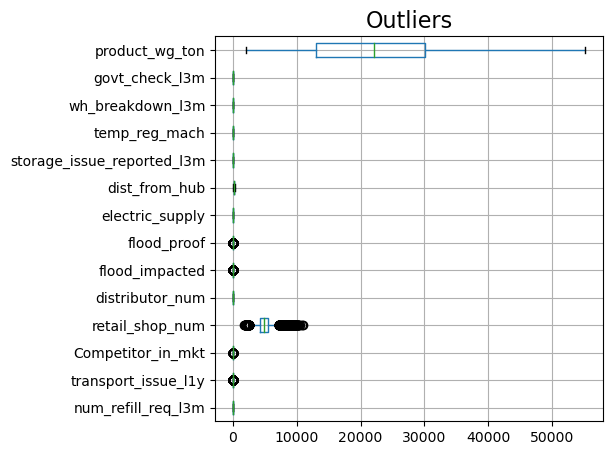

In [33]:
plt.figure(figsize=(5,5))
df[numerical].boxplot(vert=0)
plt.title('Outliers',fontsize=16)
plt.show()

In [34]:
df[numerical].max().sort_values()

flood_impacted                    1
flood_proof                       1
electric_supply                   1
temp_reg_mach                     1
transport_issue_l1y               5
wh_breakdown_l3m                  6
num_refill_req_l3m                8
Competitor_in_mkt                12
govt_check_l3m                   32
storage_issue_reported_l3m       39
distributor_num                  70
dist_from_hub                   271
retail_shop_num               11008
product_wg_ton                55151
dtype: int64

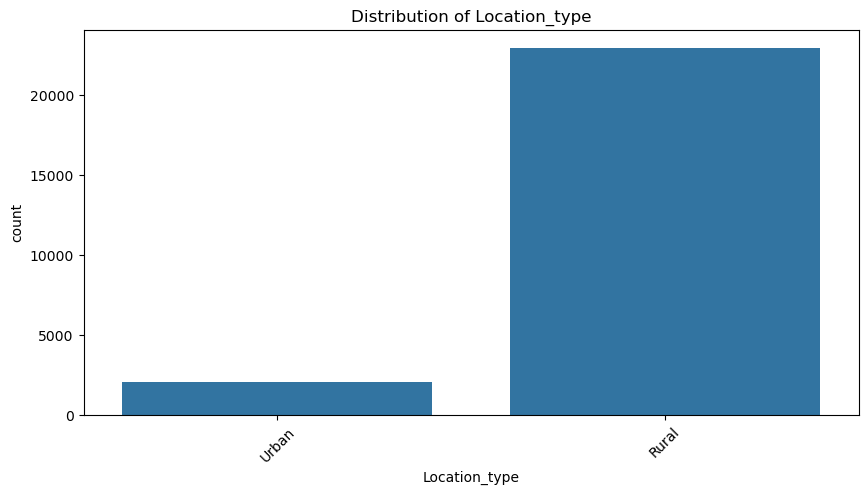

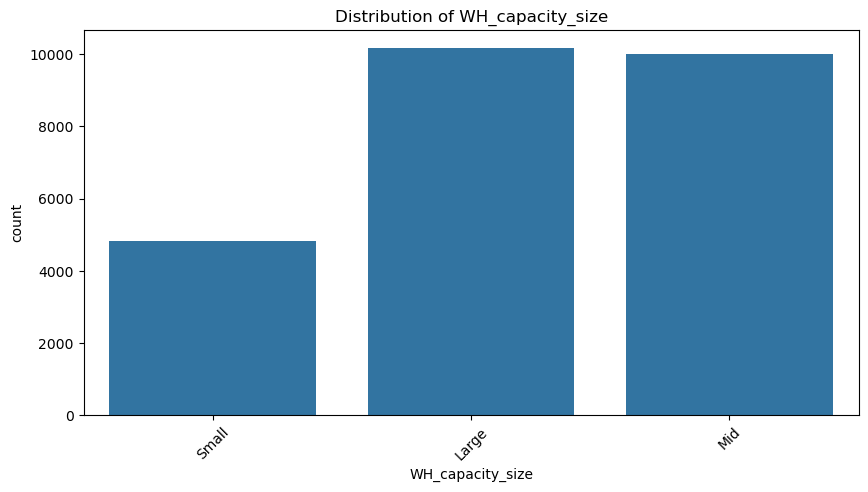

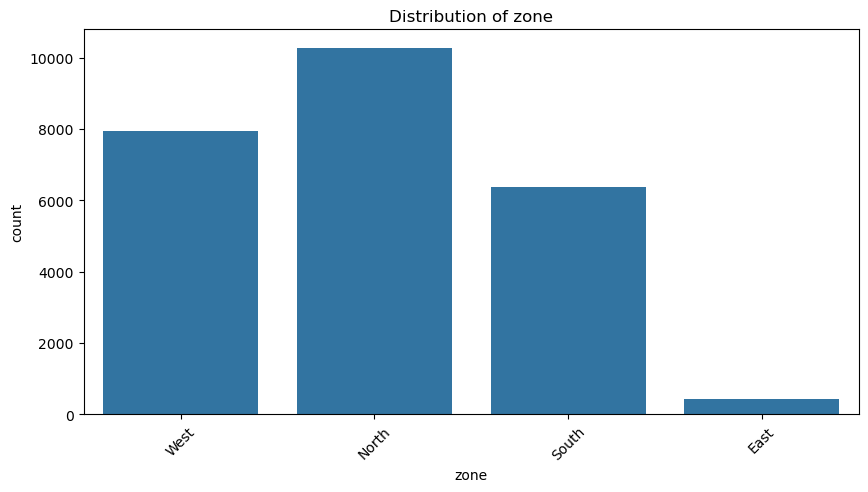

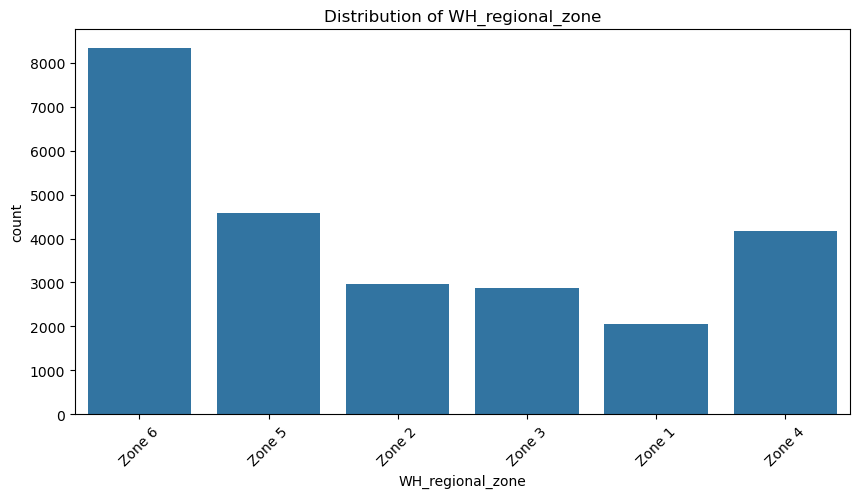

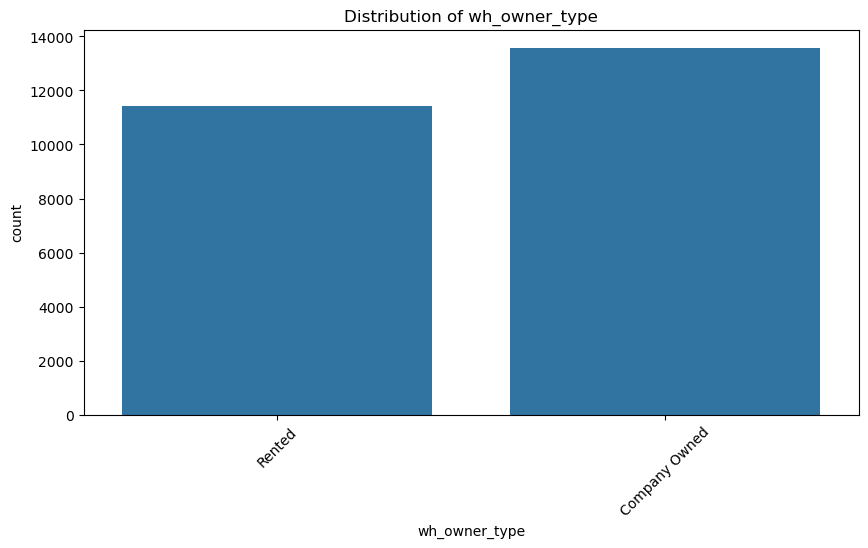

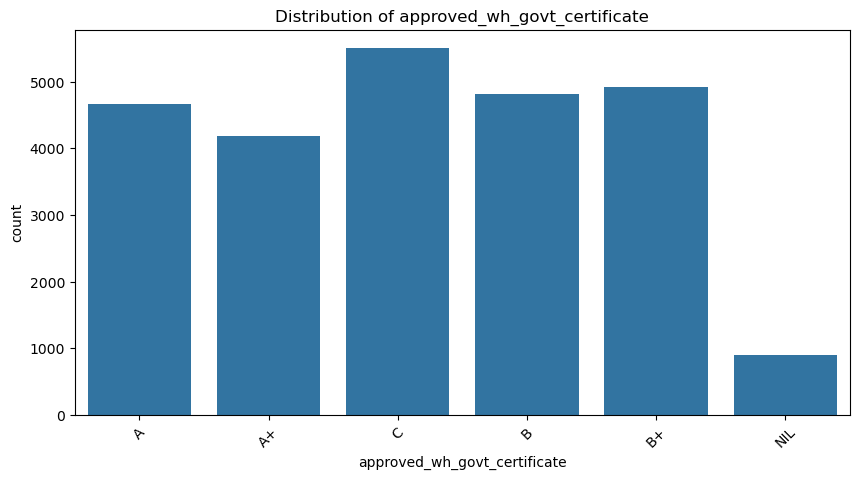

In [35]:
#categorical and continuous Features based on the data
# Distribution of Numerical Features

#categorical and continuous attributes based on the train data
categorical_features = ['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone','wh_owner_type', 'approved_wh_govt_certificate']

continuous_features = ['num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt', 'retail_shop_num','distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply',
                         'dist_from_hub','workers_num', 'wh_est_year', 'storage_issue_reported_l3m', 'temp_reg_mach', 'wh_breakdown_l3m','product_wg_ton']
     
     

# Univariate Analysis for Categorical Attributes in train data
for features in  categorical_features:
    plt.figure(figsize=(10, 5))
    sns.countplot(x=features, data=df)
    plt.title(f'Distribution of {features}')
    plt.xticks(rotation=45)
    plt.show()


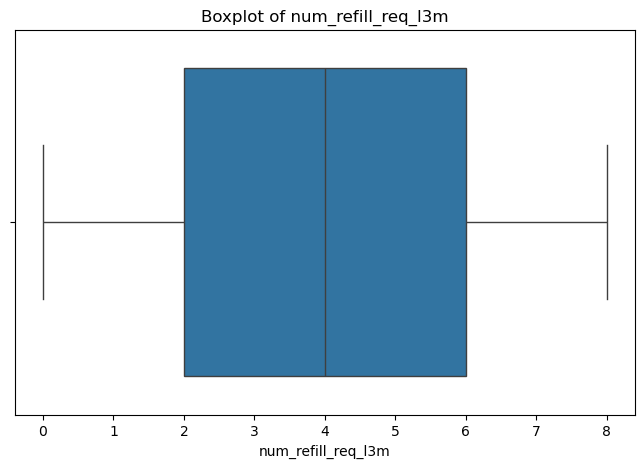

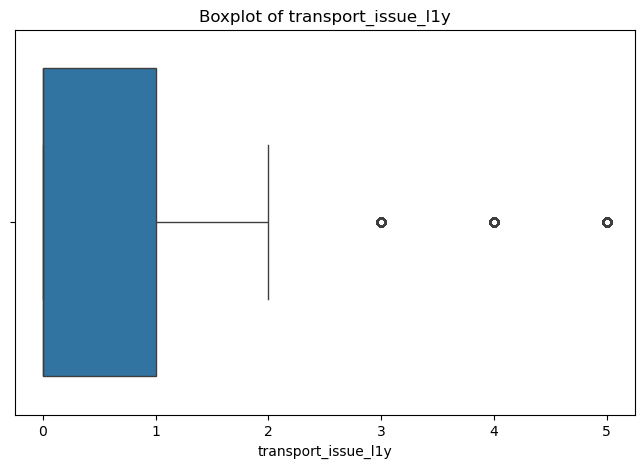

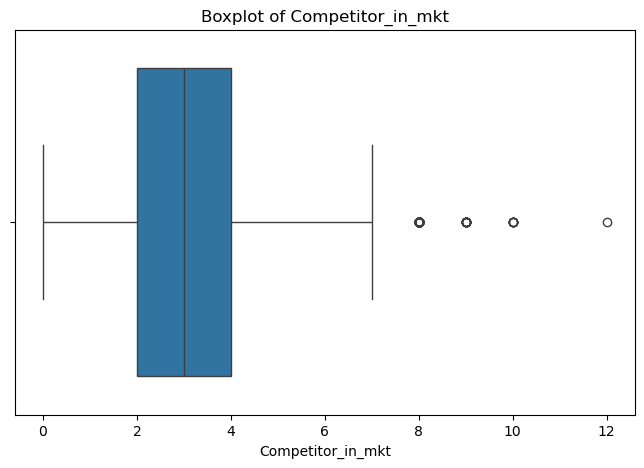

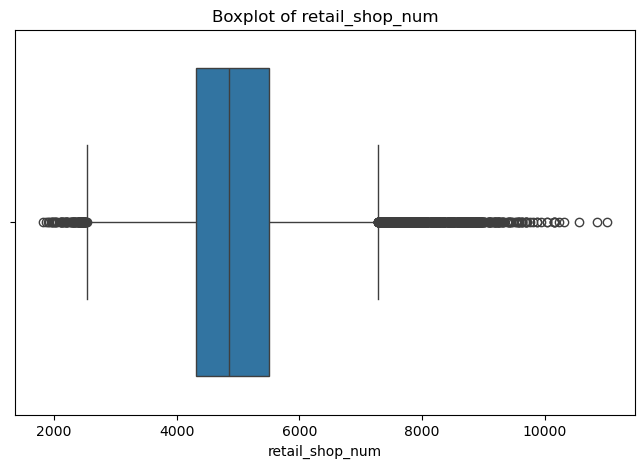

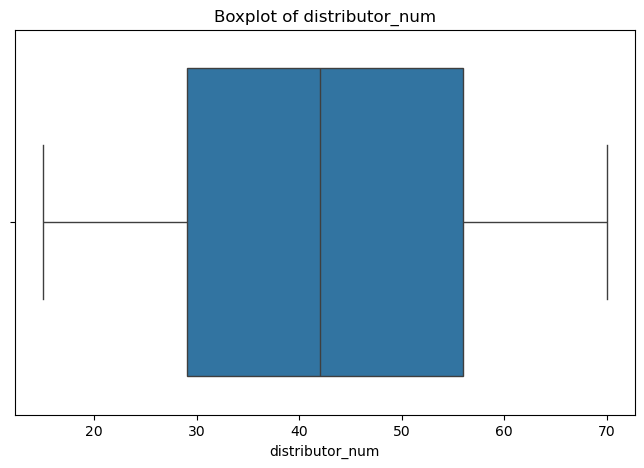

...

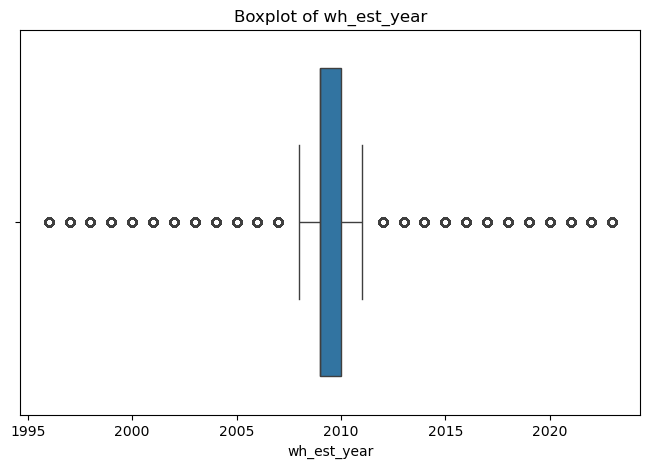

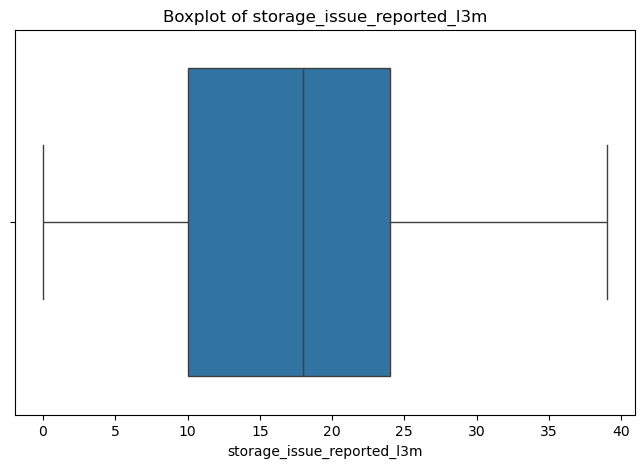

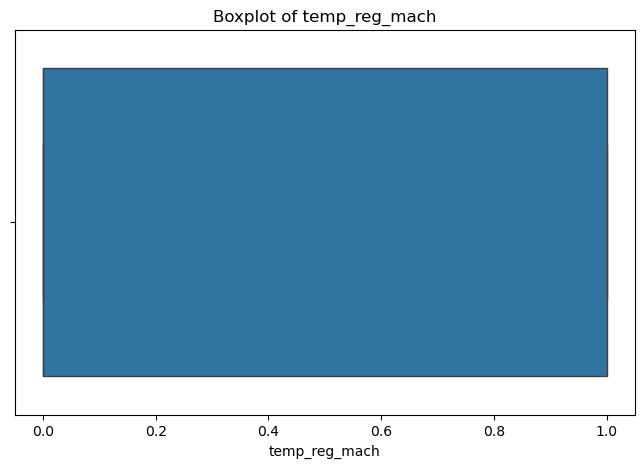

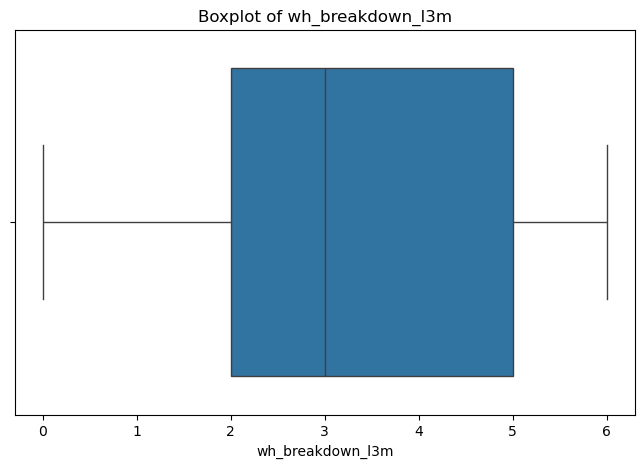

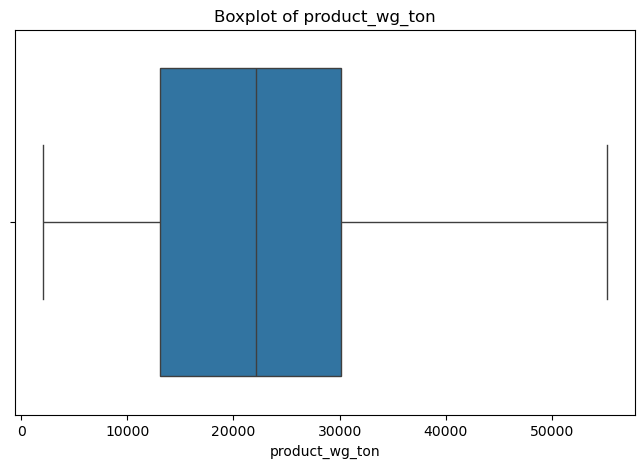

In [36]:
# Univariate Analysis for Continuous features using Boxplots in train data
for features in continuous_features:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df[features])
    plt.title(f'Boxplot of {features}')
    plt.show()

In [37]:

# Number of outliers
def outlier_check(data,n):
    for col in data.columns:
        if data[col].dtype == 'int64' or data[col].dtype == 'float64':
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_range= Q1-(n * IQR)
            upper_range= Q3+(n * IQR)
            print(f"{style.BOLD}{col}{style.END}")
            print("Number of outliers:",data[(data[col] > upper_range) | (data[col] < lower_range)].shape[0])
            print("Percentage of outliers:{0:10.3f}".format(((data[(data[col] > upper_range) | (data[col] < lower_range)].shape[0])/data.shape[0])*100),"%\n")

In [38]:
outlier_check(df, 1.5)

num_refill_req_l3m
Number of outliers: 0
Percentage of outliers:     0.000 %

transport_issue_l1y
Number of outliers: 2943
Percentage of outliers:    11.772 %

Competitor_in_mkt
Number of outliers: 96
Percentage of outliers:     0.384 %

retail_shop_num
Number of outliers: 948
Percentage of outliers:     3.792 %

distributor_num
Number of outliers: 0
Percentage of outliers:     0.000 %

flood_impacted
Number of outliers: 2454
Percentage of outliers:     9.816 %

flood_proof
Number of outliers: 1366
Percentage of outliers:     5.464 %

electric_supply
Number of outliers: 0
Percentage of outliers:     0.000 %

dist_from_hub
Number of outliers: 0
Percentage of outliers:     0.000 %

workers_num
Number of outliers: 607
Percentage of outliers:     2.428 %

wh_est_year
Number of outliers: 11140
Percentage of outliers:    44.560 %

storage_issue_reported_l3m
Number of outliers: 0
Percentage of outliers:     0.000 %

temp_reg_mach
Number of outliers: 0
Percentage of outliers:     0.000 %

wh_b

### Bivariate Analysis:

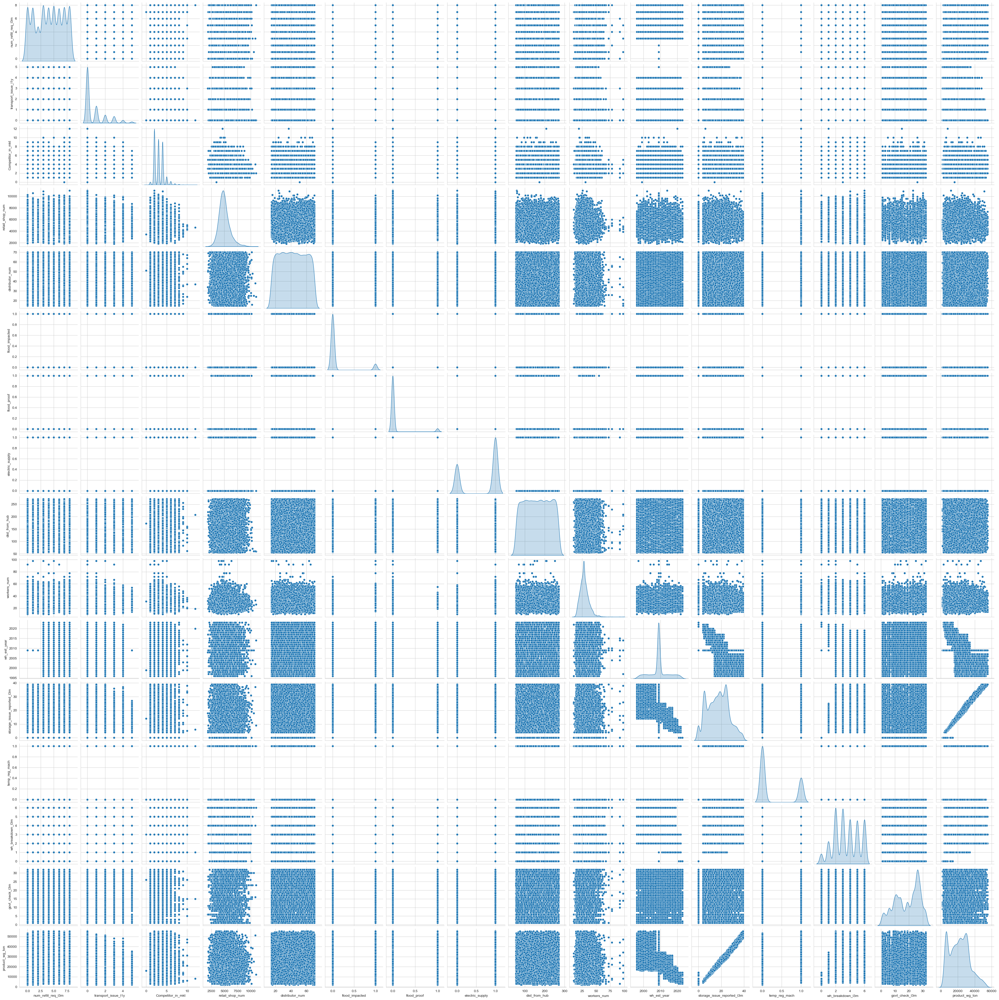

In [39]:
sns.set_style("whitegrid")
sns.pairplot(data=df,diag_kind="kde",)
plt.show()

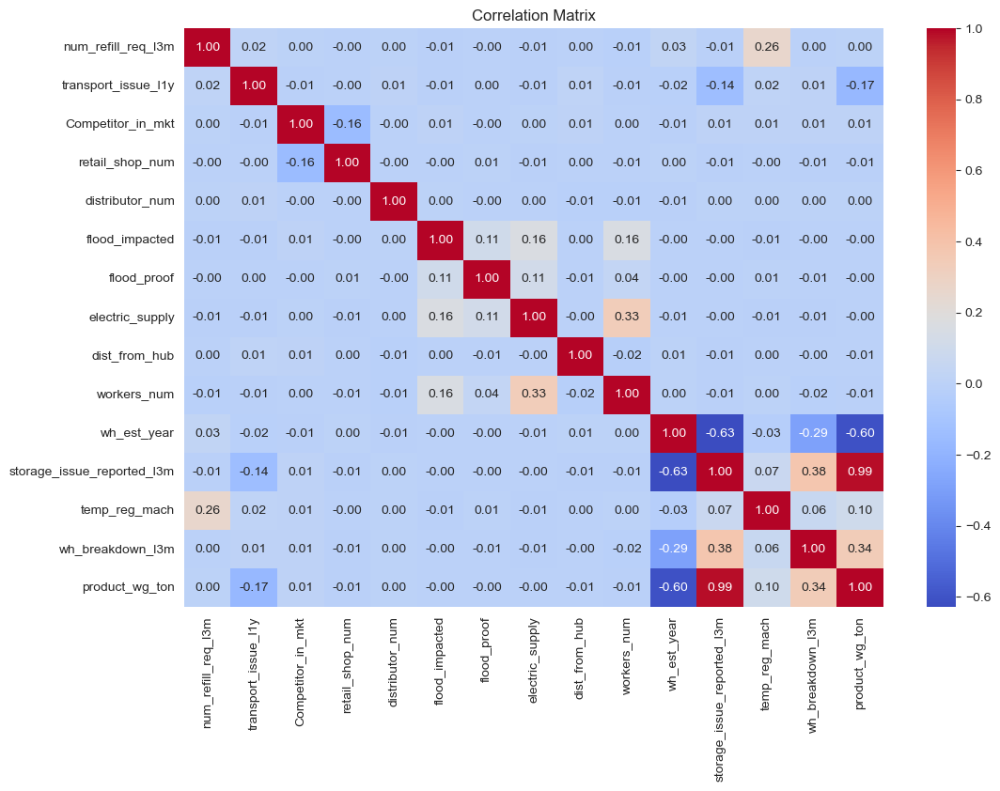

In [40]:
# Bivariate Analysis
# Relationship between different variables in train data
correlation_matrix = df[continuous_features].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### observation

<Axes: xlabel='num_refill_req_l3m', ylabel='temp_reg_mach'>

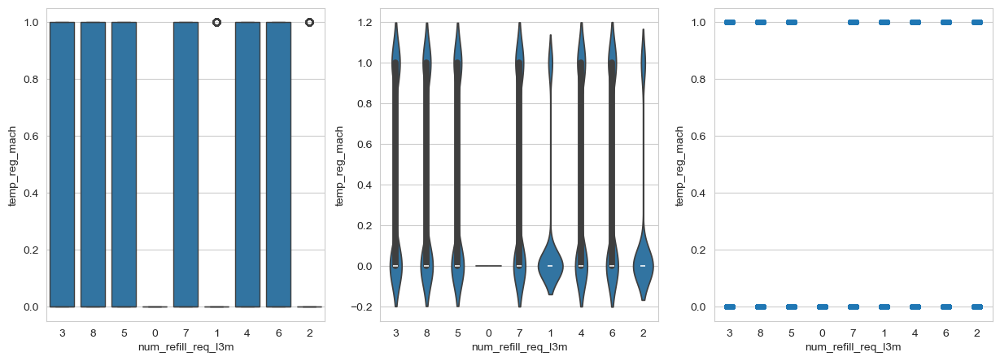

In [41]:
x = 'num_refill_req_l3m'
y = 'temp_reg_mach'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='transport_issue_l1y', ylabel='storage_issue_reported_l3m'>

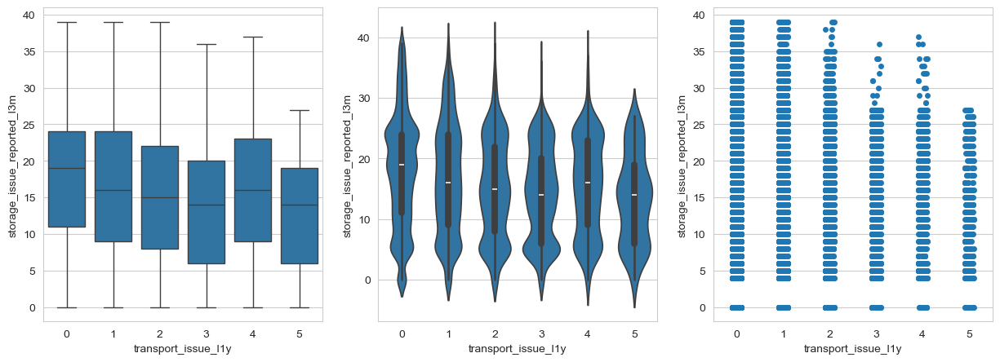

In [42]:
y = 'storage_issue_reported_l3m'
x = 'transport_issue_l1y'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='transport_issue_l1y', ylabel='product_wg_ton'>

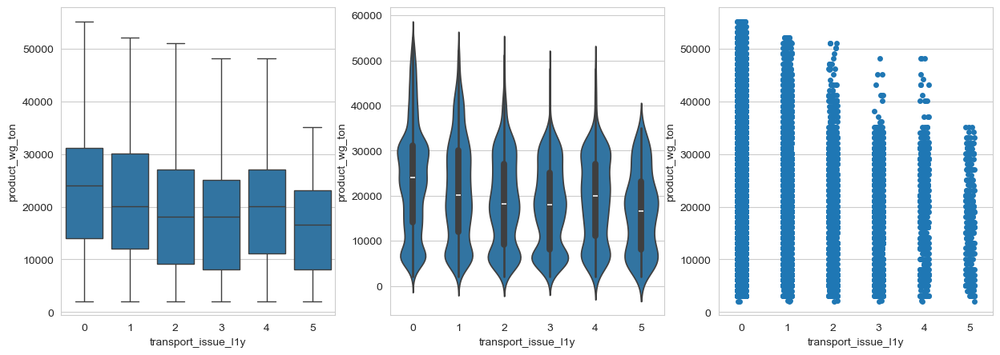

In [43]:
x = 'transport_issue_l1y'
y = 'product_wg_ton'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='Competitor_in_mkt', ylabel='retail_shop_num'>

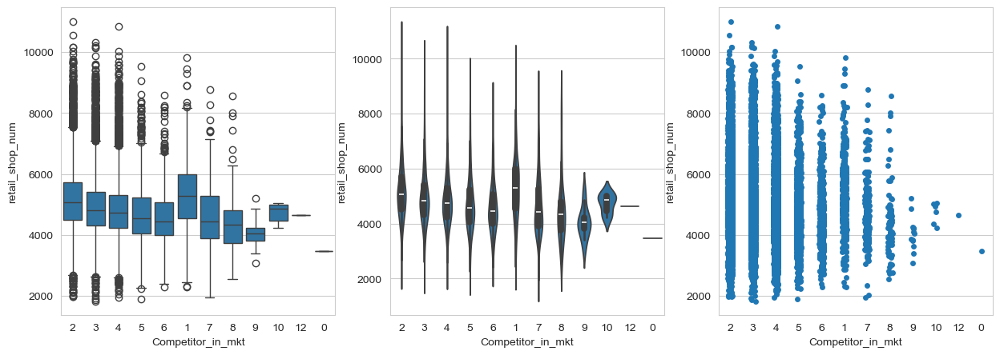

In [44]:
x = 'Competitor_in_mkt'
y = 'retail_shop_num'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='flood_impacted', ylabel='electric_supply'>

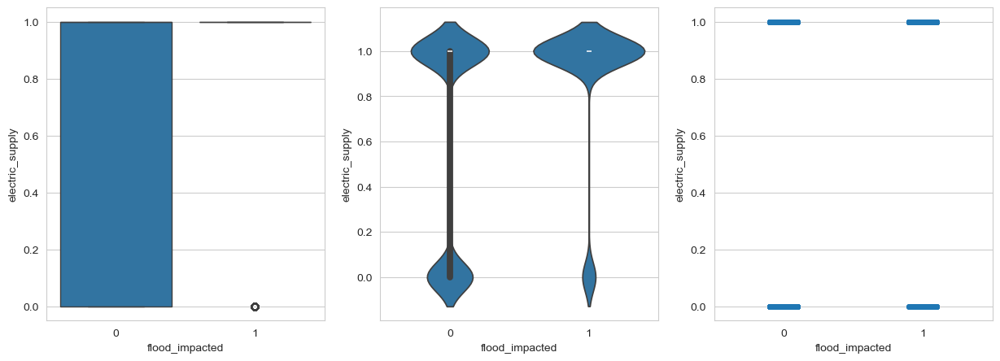

In [45]:
x = 'flood_impacted'
y = 'electric_supply'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='flood_proof', ylabel='electric_supply'>

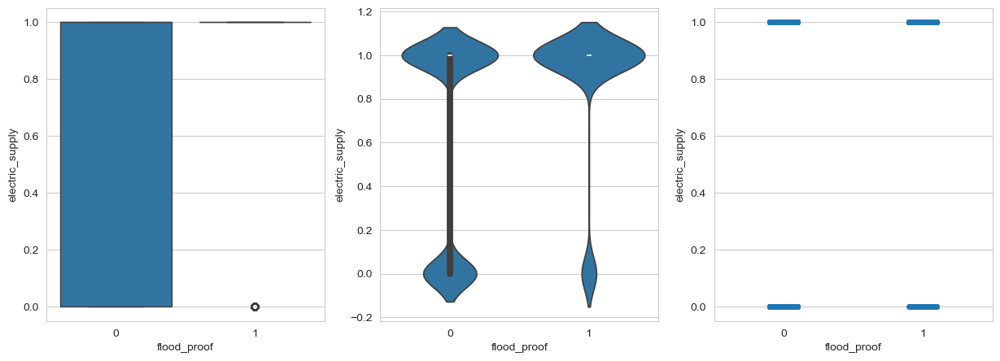

In [46]:
x = 'flood_proof'
y = 'electric_supply'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='workers_num', ylabel='electric_supply'>

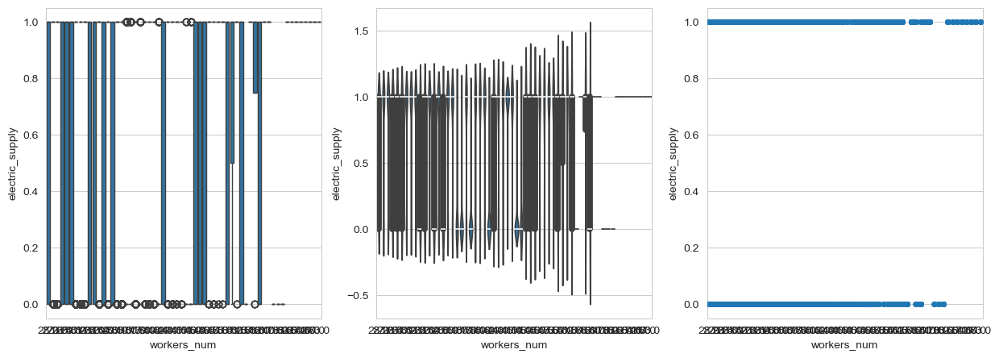

In [47]:
x = 'workers_num'
y = 'electric_supply'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_est_year', ylabel='storage_issue_reported_l3m'>

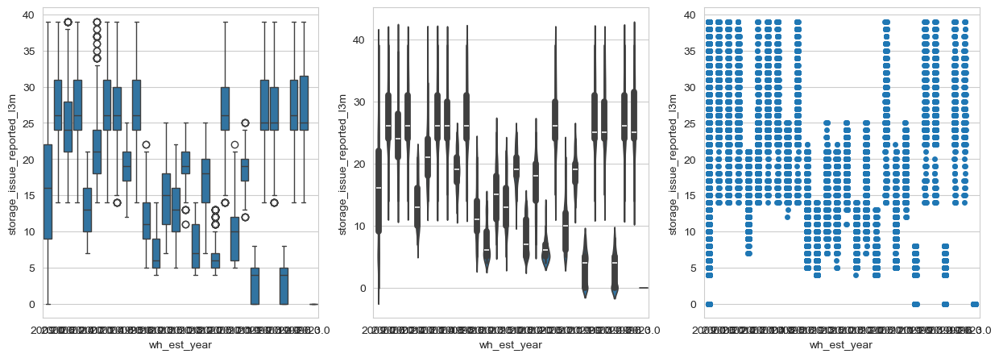

In [48]:
x = 'wh_est_year'
y = 'storage_issue_reported_l3m'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_est_year', ylabel='wh_breakdown_l3m'>

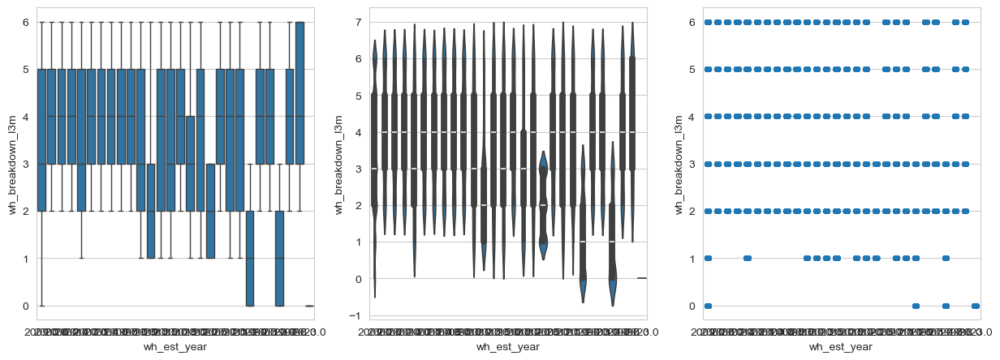

In [49]:
x = 'wh_est_year'
y = 'wh_breakdown_l3m'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_est_year', ylabel='product_wg_ton'>

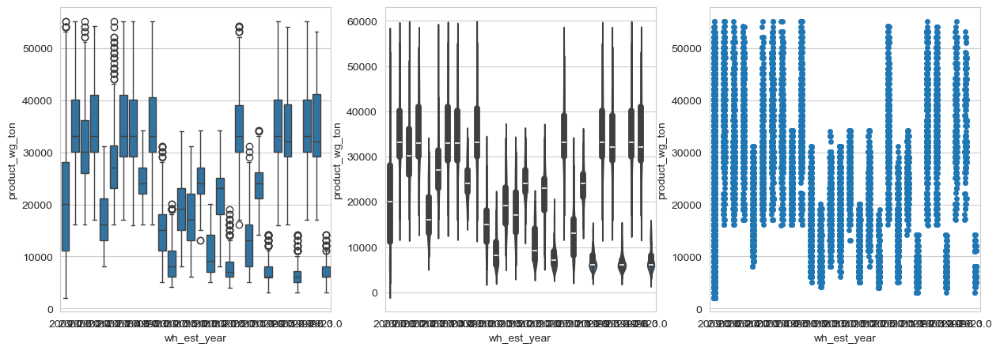

In [50]:
x = 'wh_est_year'
y = 'product_wg_ton'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='storage_issue_reported_l3m', ylabel='wh_breakdown_l3m'>

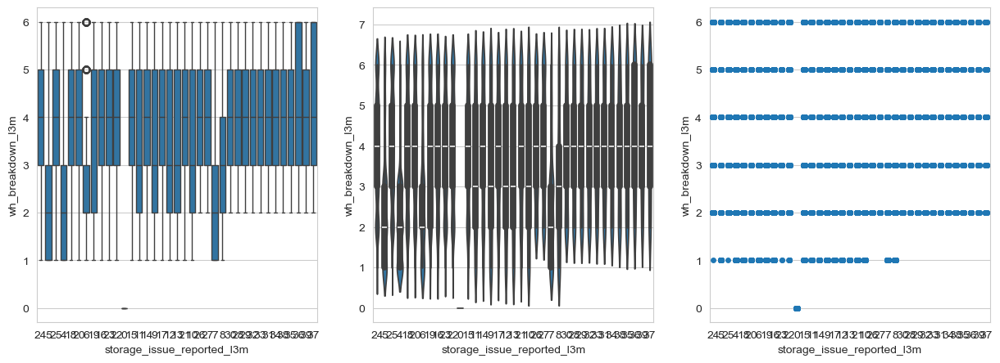

In [51]:
x = 'storage_issue_reported_l3m'
y = 'wh_breakdown_l3m'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_est_year', ylabel='product_wg_ton'>

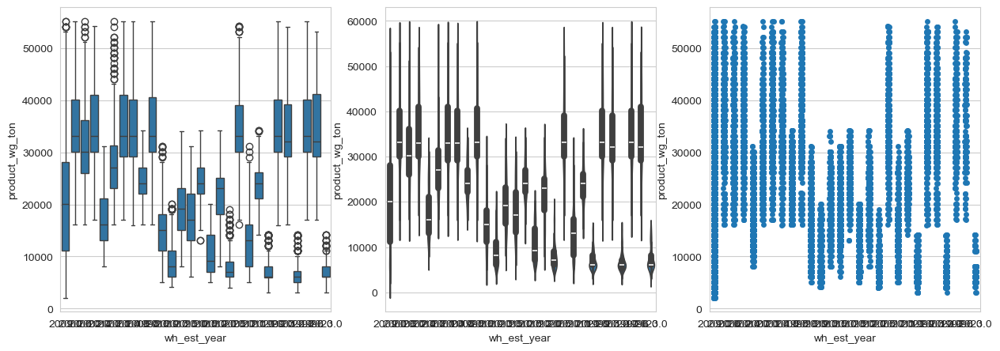

In [52]:
x = 'wh_est_year'
y = 'product_wg_ton'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='storage_issue_reported_l3m', ylabel='transport_issue_l1y'>

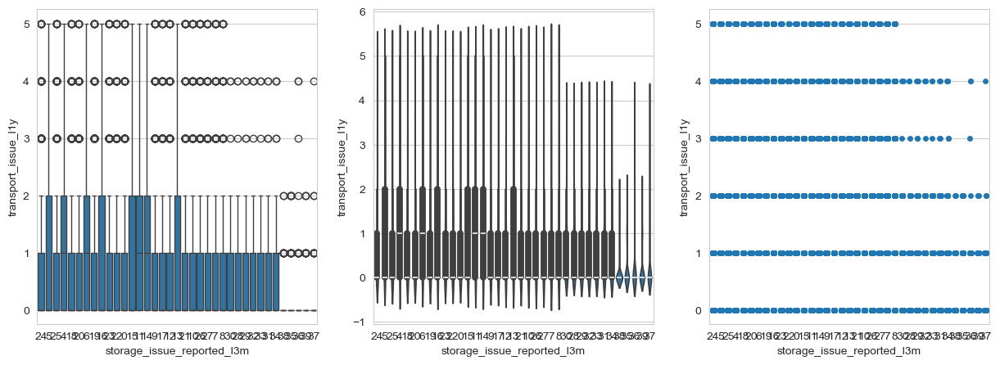

In [53]:
x = 'storage_issue_reported_l3m'
y = 'transport_issue_l1y'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='temp_reg_mach', ylabel='num_refill_req_l3m'>

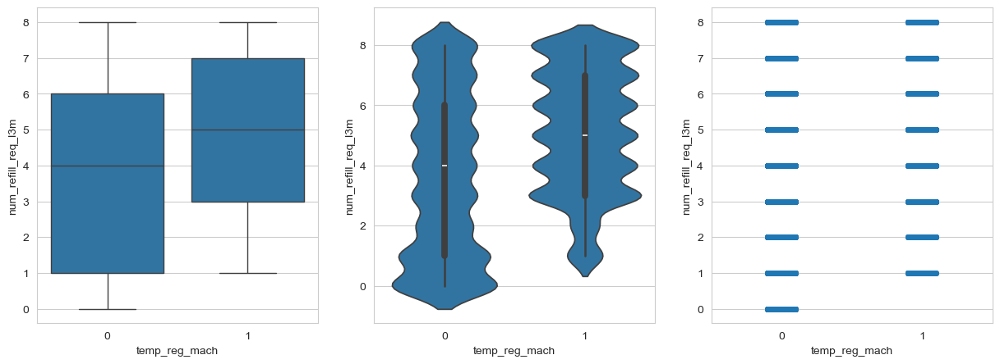

In [54]:
x = 'temp_reg_mach'
y = 'num_refill_req_l3m'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_breakdown_l3m', ylabel='wh_est_year'>

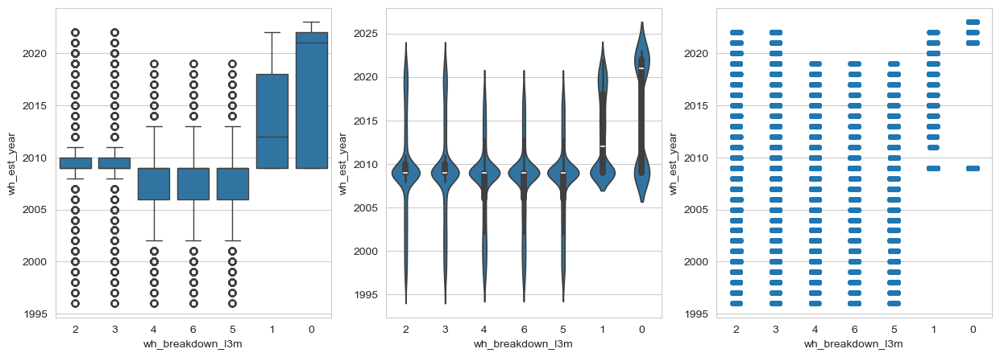

In [55]:
x = 'wh_breakdown_l3m'
y = 'wh_est_year'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_breakdown_l3m', ylabel='storage_issue_reported_l3m'>

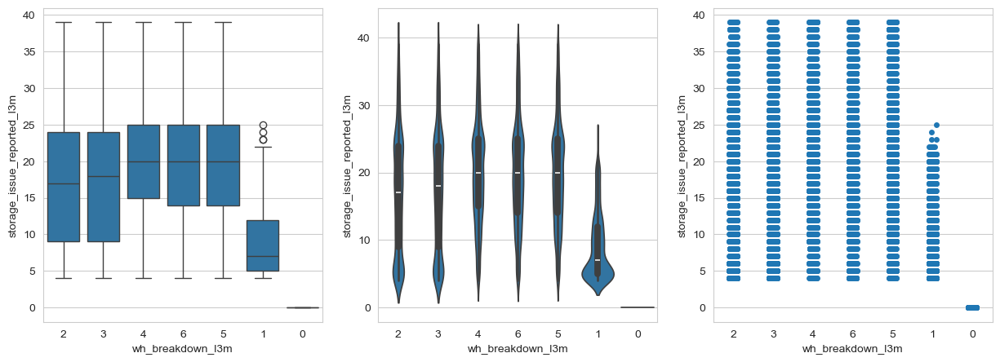

In [56]:
x = 'wh_breakdown_l3m'
y = 'storage_issue_reported_l3m'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

<Axes: xlabel='wh_breakdown_l3m', ylabel='product_wg_ton'>

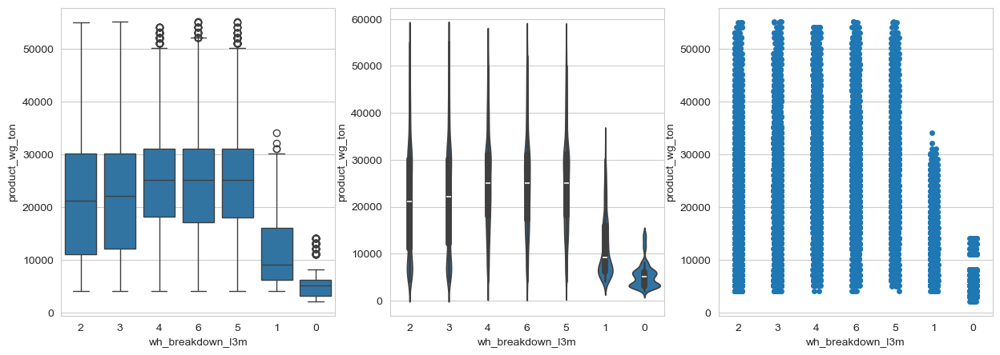

In [57]:
x = 'wh_breakdown_l3m'
y = 'product_wg_ton'
order=df[x].value_counts().index
plt.figure(figsize= (15,5))
plt.subplot(1,3,1)
sns.boxplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,2)
sns.violinplot(x=df[x], y=df[y], data=df, order=order)
plt.subplot(1,3,3)
sns.stripplot(x=df[x], y=df[y], data=df, order=order)

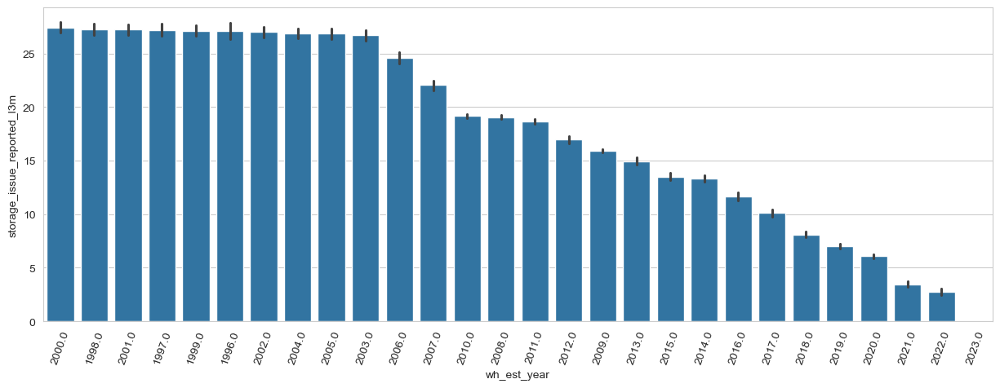

In [58]:
x = 'wh_est_year'
y = 'storage_issue_reported_l3m'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);


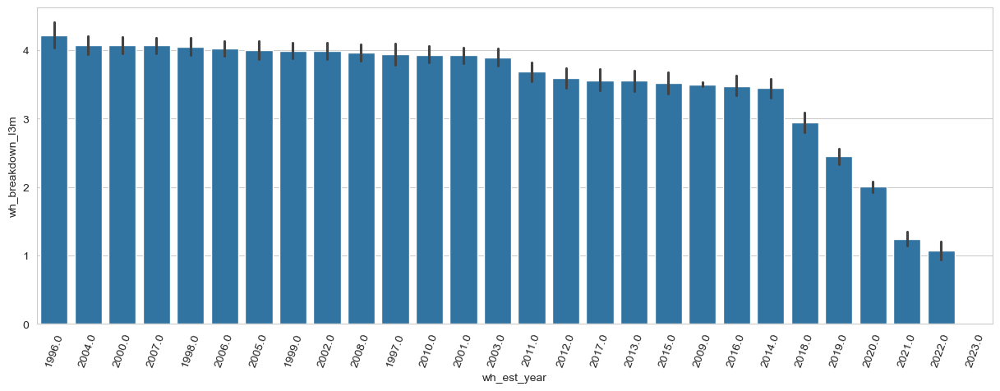

In [59]:
x = 'wh_est_year'
y = 'wh_breakdown_l3m'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

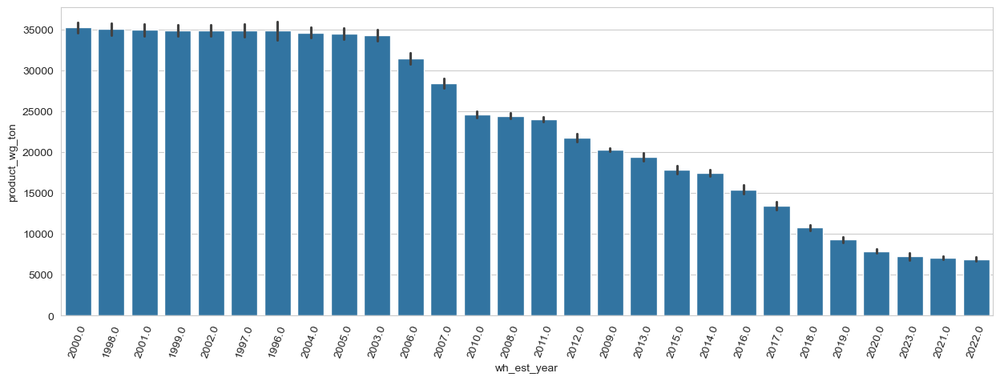

In [60]:
x = 'wh_est_year'
y = 'product_wg_ton'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

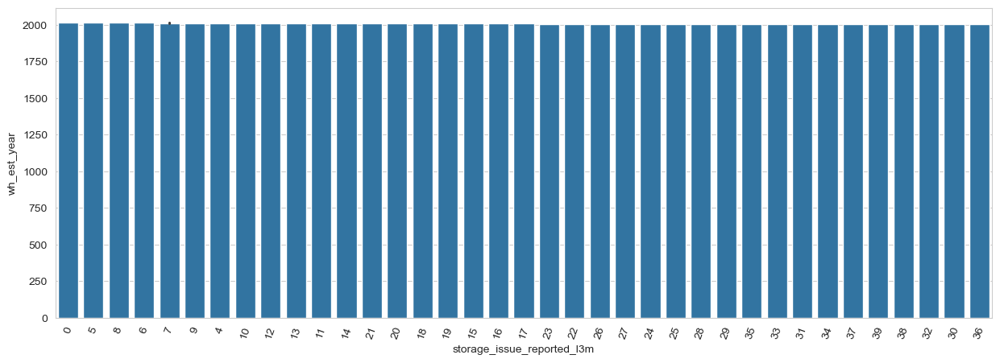

In [61]:
x = 'storage_issue_reported_l3m'
y = 'wh_est_year'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

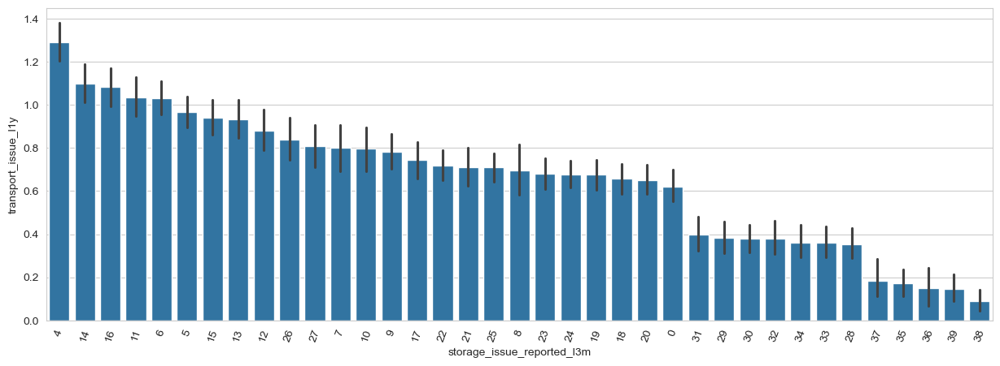

In [62]:
x = 'storage_issue_reported_l3m'
y = 'transport_issue_l1y'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

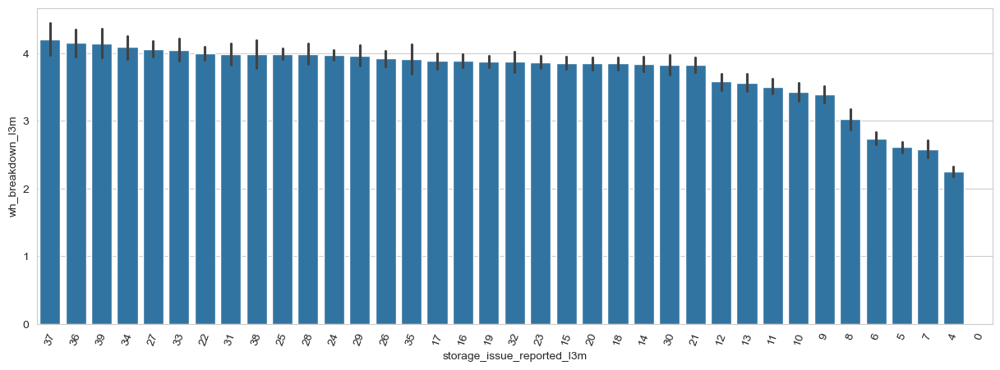

In [63]:
x = 'storage_issue_reported_l3m'
y = 'wh_breakdown_l3m'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

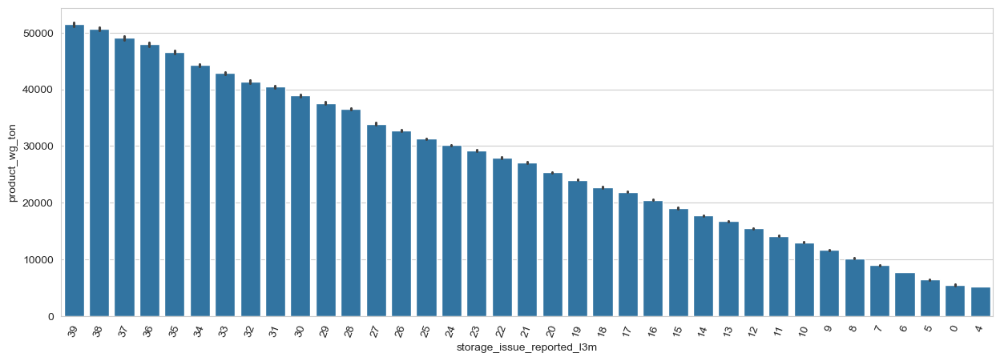

In [64]:
x = 'storage_issue_reported_l3m'
y = 'product_wg_ton'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

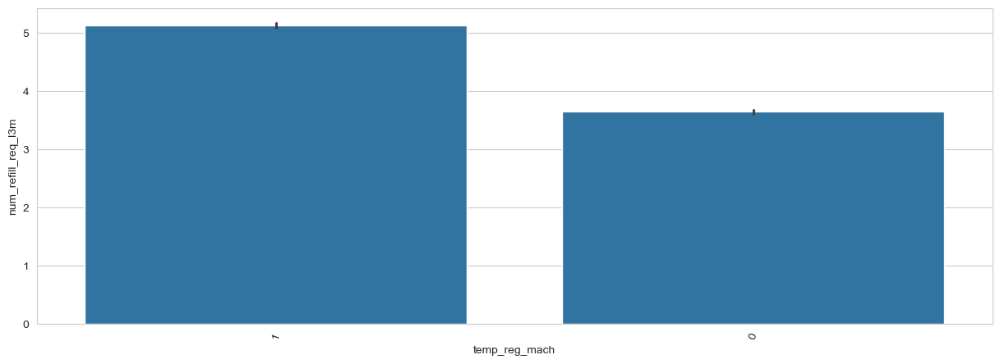

In [65]:
x = 'temp_reg_mach'
y = 'num_refill_req_l3m'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

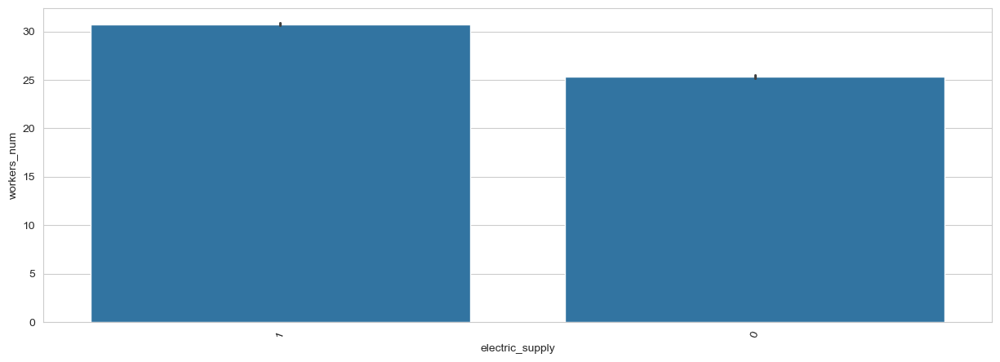

In [66]:
x = 'electric_supply'
y = 'workers_num'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

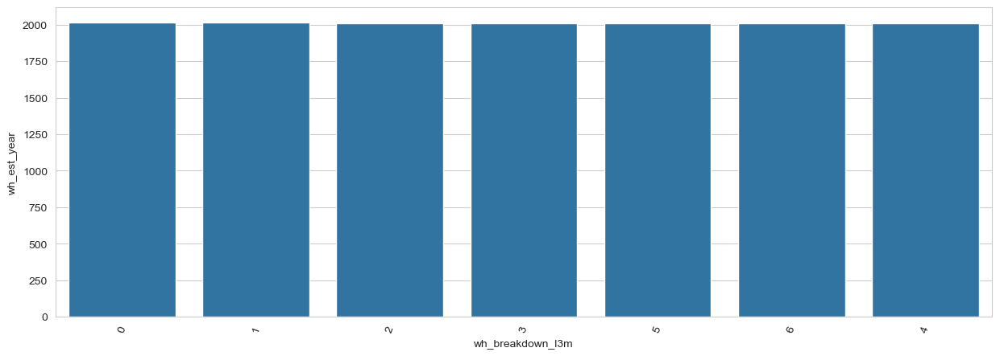

In [67]:
x = 'wh_breakdown_l3m'
y = 'wh_est_year'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

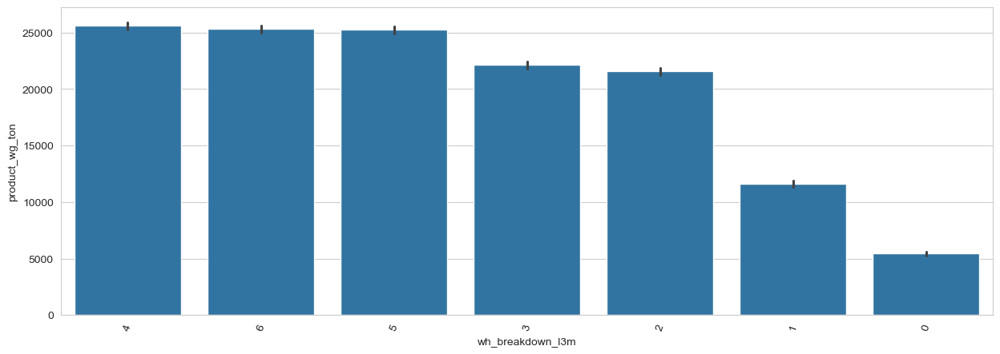

In [68]:
x = 'wh_breakdown_l3m'
y = 'product_wg_ton'
order=df.groupby(x)[y].mean().sort_values(ascending=False).index
plt.figure(figsize= (15,5))
sns.barplot(x=df[x], y=df[y], data=df, order=order)
plt.xticks(rotation=70);

### Observation

### Multivariate analysis

In [69]:
df.columns

Index(['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone',
       'num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'wh_owner_type', 'distributor_num', 'flood_impacted',
       'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
       'wh_est_year', 'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'product_wg_ton'],
      dtype='object')

### Obeservation

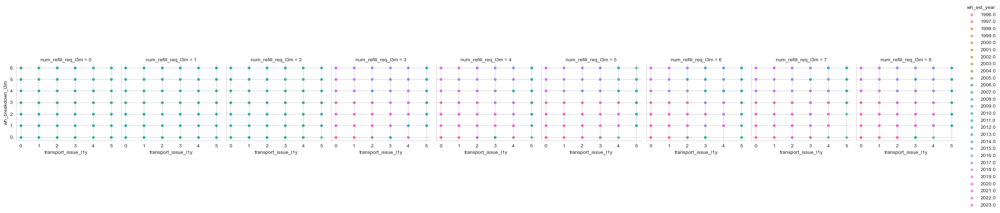

In [70]:
g = sns.FacetGrid(df, col="num_refill_req_l3m", hue="wh_est_year")
g.map(sns.scatterplot, "transport_issue_l1y","wh_breakdown_l3m", alpha=.7)
g.add_legend()

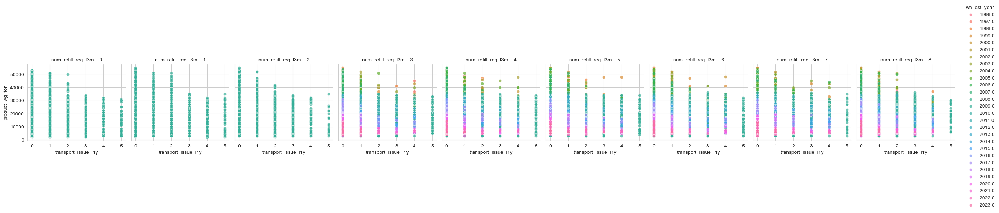

In [71]:
g = sns.FacetGrid(df, col="num_refill_req_l3m", hue="wh_est_year")
g.map(sns.scatterplot, "transport_issue_l1y","product_wg_ton", alpha=.7)
g.add_legend()

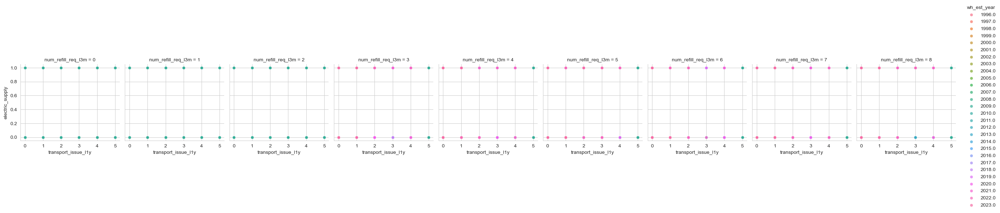

In [72]:
g = sns.FacetGrid(df, col="num_refill_req_l3m", hue="wh_est_year")
g.map(sns.scatterplot, "transport_issue_l1y","electric_supply", alpha=.7)
g.add_legend()

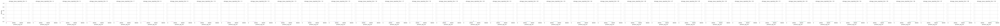

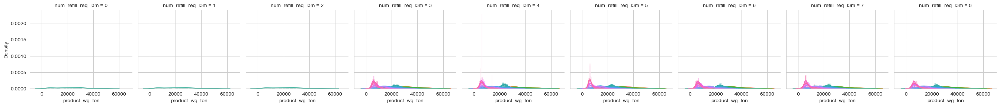

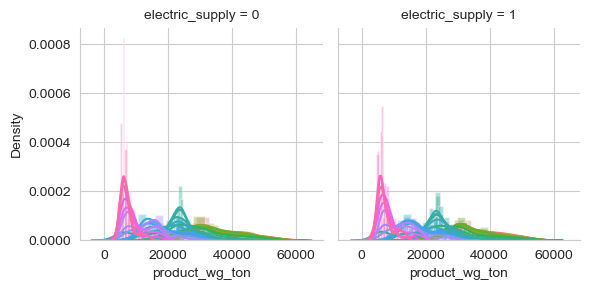

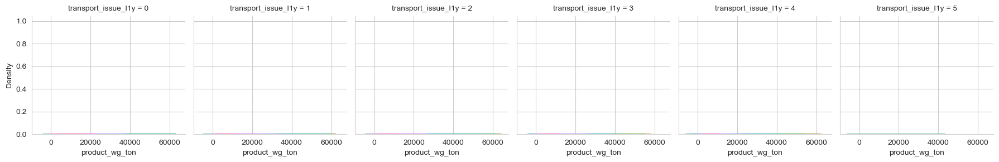

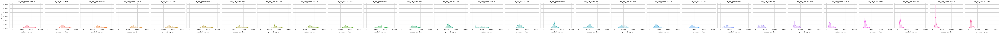

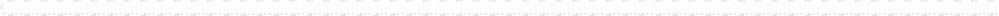

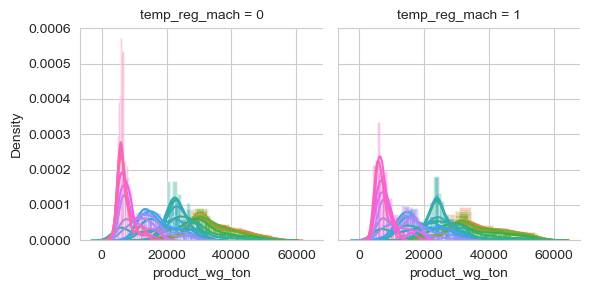

In [73]:
for col in ['storage_issue_reported_l3m', 'num_refill_req_l3m', 'electric_supply', 'transport_issue_l1y', 'wh_est_year','workers_num','temp_reg_mach']:
    g = sns.FacetGrid(df, col=col, hue = 'wh_est_year')
    g.map(sns.distplot, "product_wg_ton");

### Observation

In [74]:
#identifying outliers in train data
cols = ['Competitor_in_mkt','retail_shop_num','workers_num']
def handle_outliers_iqr(data, column):
    # Calculate the first and third quartiles (Q1 and Q3)
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)

    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1

    # Define the upper and lower bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

     # Replace outliers with the upper or lower bound
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

In [75]:
#identifying outliers in train data
cols = ['Competitor_in_mkt','retail_shop_num','workers_num']
def handle_outliers_iqr(data, column):
    # Calculate the first and third quartiles (Q1 and Q3)
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)

    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1

    # Define the upper and lower bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

     # Replace outliers with the upper or lower bound
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

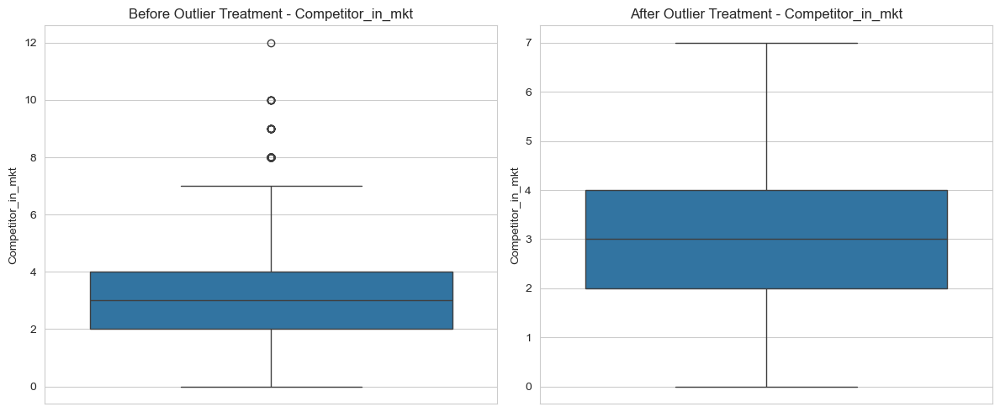

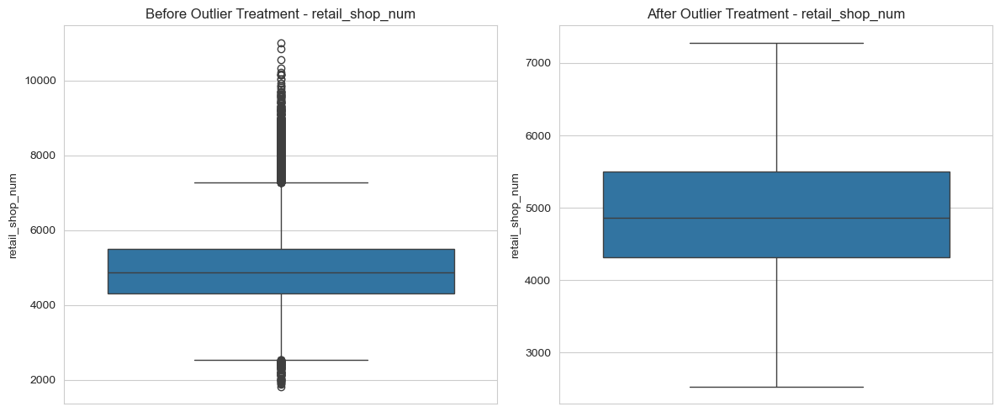

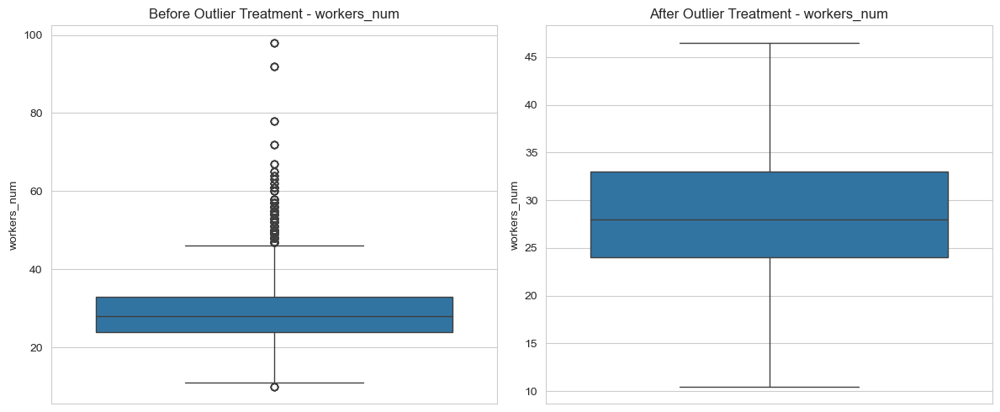

After handling outliers:
       Competitor_in_mkt  retail_shop_num  workers_num
count           25000.00         25000.00     25000.00
mean                3.10          4958.89        28.74
std                 1.12           969.40         7.14
min                 0.00          2532.50        10.50
25%                 2.00          4313.00        24.00
50%                 3.00          4859.00        28.00
75%                 4.00          5500.00        33.00
max                 7.00          7280.50        46.50


In [76]:

# Apply the outlier treatment to specified columns
for column in cols:
     # Create a 1x3 subplot grid for each column
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Display boxplot before outlier treatment
    sns.boxplot(df[column], ax=axes[0])
    axes[0].set_title(f'Before Outlier Treatment - {column}')

    # Handle outliers using the defined function
    handle_outliers_iqr(df, column)

    # Display boxplot after outlier treatment
    sns.boxplot(df[column], ax=axes[1])
    axes[1].set_title(f'After Outlier Treatment - {column}')

    # Adjust layout for better visibility
    plt.tight_layout()
    plt.show()

# Verify the changes
print("After handling outliers:")
print(df[cols].describe())

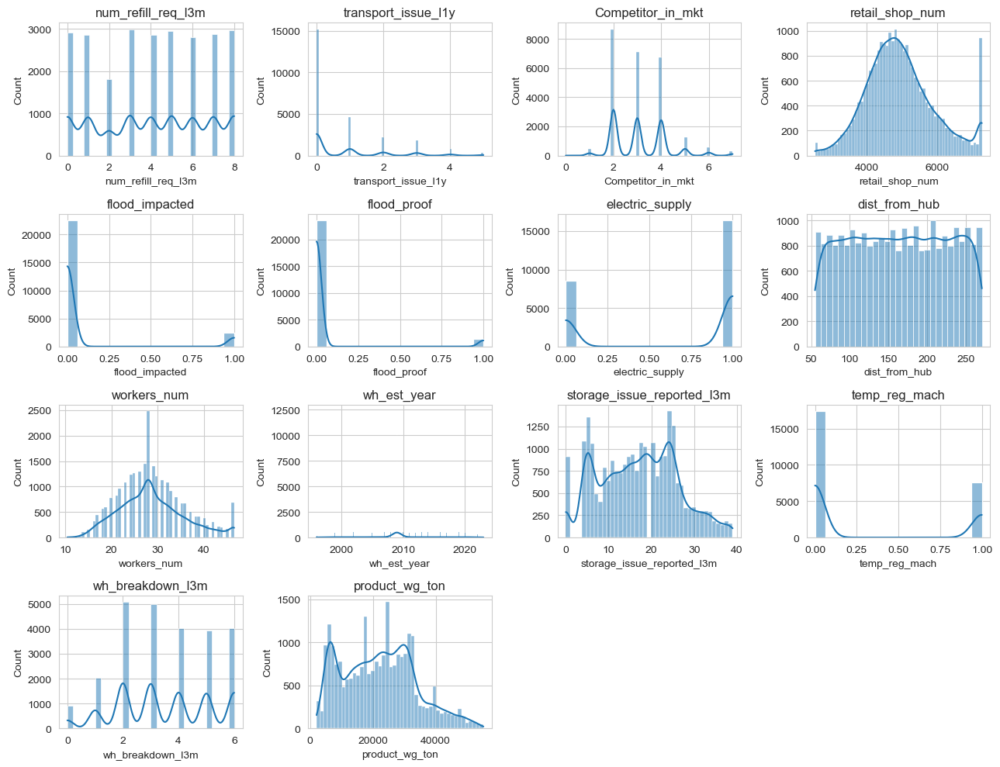

In [77]:
# Plot histograms for numerical features
numerical_columns = ['num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt', 'retail_shop_num',
                     'flood_impacted', 'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
                     'wh_est_year', 'storage_issue_reported_l3m', 'temp_reg_mach', 'wh_breakdown_l3m', 'product_wg_ton']

plt.figure(figsize=(13, 10))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()
     


### FINDINGS:
num_refill_req_l3m:
Right-skewed distribution with a peak around 8 refill requests. Most warehouses have a moderate level of refill requests, but a few experience significantly higher numbers.

### transport_issue_l1y:
Slightly right-skewed distribution. Most warehouses have a low number of transport issues, but a few have a higher frequency.

### Competitor_in_mkt:
Majority of warehouses face competition from 2 to 3 competitors. Fewer warehouses experience higher levels of competition.

### Retail_shop_num:
Somewhat right-skewed distribution. Most warehouses have a moderate number of retail shops, but some have a higher count.

### dist_from_hub:
Distribution of distances from the warehouse to the production hub is spread out. Peak in the middle range, indicating variation in distances among the warehouses.

### workers_num:
Somewhat normally distributed. Peak around 24 to 28 workers, suggesting many warehouses have a similar number of workers.

### wh_est_year:
Discrete distribution, no specific trend. Warehouses were established over a range of years, reflecting the establishment years of the warehouses.

### product_wg_ton:
Relatively uniform distribution. Warehouses produce noodles with a variety of product weights.



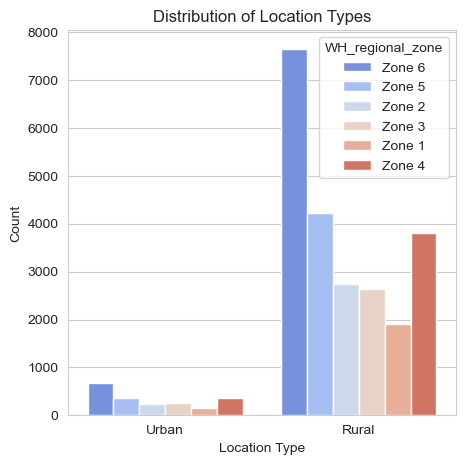

In [78]:
plt.figure(figsize=(5,5))
sns.countplot(data=df, x='Location_type',hue='WH_regional_zone',palette='coolwarm')
plt.title('Distribution of Location Types')
plt.xlabel('Location Type')
plt.ylabel('Count')
plt.show()

In [79]:
def count_outliers(df):
    outliers={}
    for i in df.columns:
        if pd.api.types.is_numeric_dtype(df[i]):
            q1 = df[i].quantile(0.25)
            q3 = df[i].quantile(0.75)
            iqr = q3 - q1
            lower = q1 - 1.5*iqr
            upper = q3 + 1.5*iqr
            outliers[i] = df[(df[i] < lower) | (df[i] > upper)].shape[0]
        else:
            pass
    return outliers

In [80]:
outlier_counts = count_outliers(df)
outlier_counts

{'num_refill_req_l3m': 0,
 'transport_issue_l1y': 2943,
 'Competitor_in_mkt': 0,
 'retail_shop_num': 0,
 'distributor_num': 0,
 'flood_impacted': 2454,
 'flood_proof': 1366,
 'electric_supply': 0,
 'dist_from_hub': 0,
 'workers_num': 0,
 'wh_est_year': 11140,
 'storage_issue_reported_l3m': 0,
 'temp_reg_mach': 0,
 'wh_breakdown_l3m': 0,
 'govt_check_l3m': 0,
 'product_wg_ton': 0}

In [81]:
def remove_outliers(df):
    num_df = df.select_dtypes(include=['int', 'float'])
    q1 = num_df.quantile(0.25)
    q3 = num_df.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5*iqr
    upper = q3 + 1.5*iqr
    df_no_outliers = num_df[((num_df >= lower) & (num_df <= upper)).all(axis=1)]
    return df.loc[df_no_outliers.index]

In [82]:

df = remove_outliers(df)
df.shape

(9833, 22)

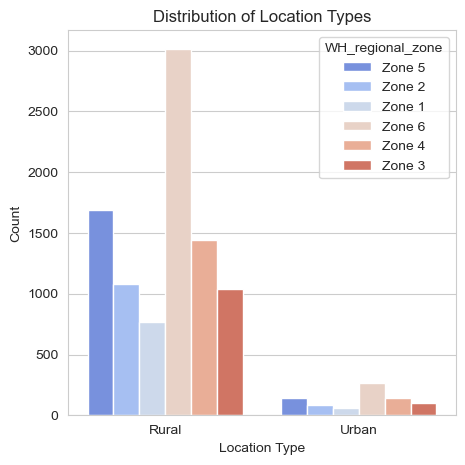

In [83]:
plt.figure(figsize=(5,5))
sns.countplot(data=df, x='Location_type',hue='WH_regional_zone',palette='coolwarm')
plt.title('Distribution of Location Types')
plt.xlabel('Location Type')
plt.ylabel('Count')
plt.show()

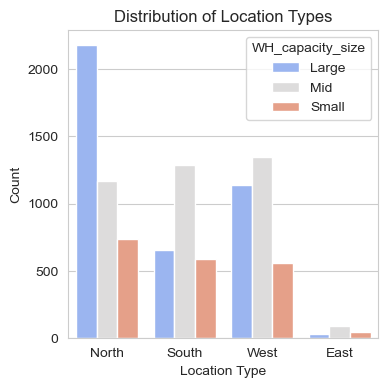

In [84]:
plt.figure(figsize=(4,4))
sns.countplot(data=df, x='zone',hue='WH_capacity_size',palette='coolwarm')
plt.title('Distribution of Location Types')
plt.xlabel('Location Type')
plt.ylabel('Count')
plt.show()

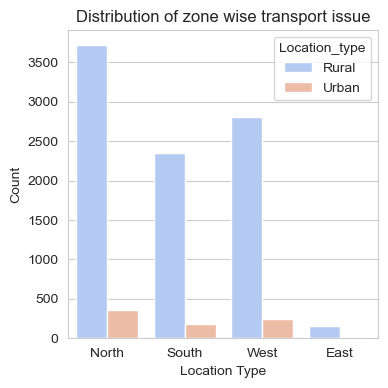

In [85]:
plt.figure(figsize=(4,4))
sns.countplot(data=df, x='zone',hue='Location_type',palette='coolwarm')
plt.title('Distribution of zone wise transport issue')
plt.xlabel('Location Type')
plt.ylabel('Count')
plt.show()

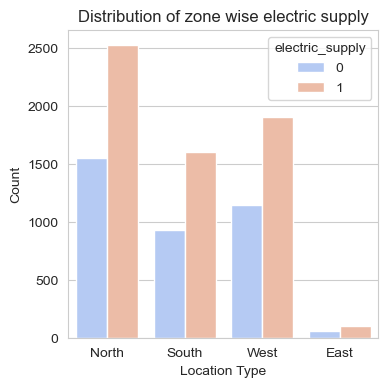

In [86]:
plt.figure(figsize=(4,4))
sns.countplot(data=df, x='zone',hue='electric_supply',palette='coolwarm')
plt.title('Distribution of zone wise electric supply')
plt.xlabel('Location Type')
plt.ylabel('Count')
plt.show()

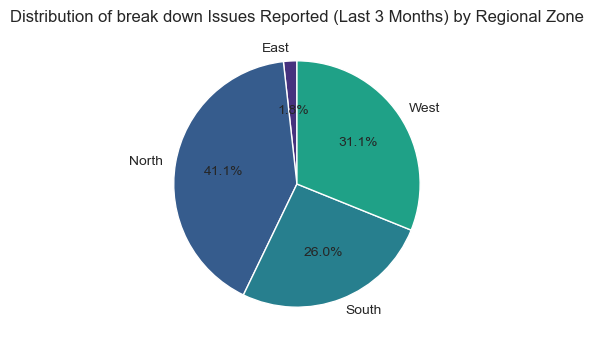

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame
plt.figure(figsize=(4, 4))

# Group by regional zone and sum the counts of storage issues
zone_storage_counts = df.groupby('zone')['wh_breakdown_l3m'].sum()

# Create a pie chart for the storage issue counts
plt.pie(zone_storage_counts, labels=zone_storage_counts.index, autopct='%1.1f%%', colors=sns.color_palette('viridis'), startangle=90)

# Add a title
plt.title('Distribution of break down Issues Reported (Last 3 Months) by Regional Zone')

# Show the pie chart
plt.show()

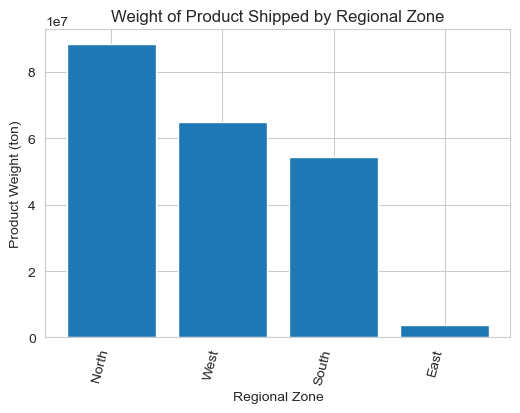

In [88]:
df_sorted = df.sort_values(by='product_wg_ton', ascending=False)
zone_group = df_sorted.groupby(['zone'])

zone_group_sum = zone_group.sum(numeric_only=True)
zone_group_sum_sorted = zone_group_sum.sort_values(by='product_wg_ton', ascending=False)

plt.figure(figsize=(6, 4))
plt.bar(x=zone_group_sum_sorted.index, height=zone_group_sum_sorted['product_wg_ton'])
plt.xticks(rotation=75, ha='right')
plt.xlabel('Regional Zone')
plt.ylabel('Product Weight (ton)')
plt.title('Weight of Product Shipped by Regional Zone')
plt.show()

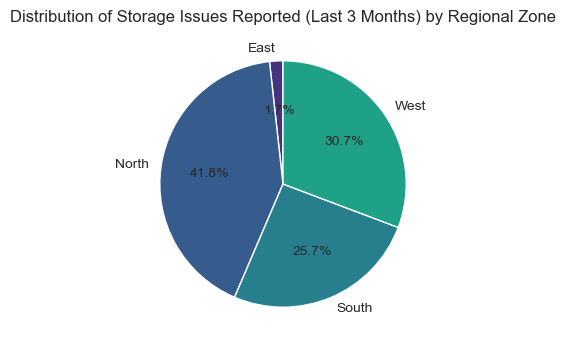

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame
plt.figure(figsize=(4, 4))

# Group by regional zone and sum the counts of storage issues
zone_storage_counts = df.groupby('zone')['storage_issue_reported_l3m'].sum()

# Create a pie chart for the storage issue counts
plt.pie(zone_storage_counts, labels=zone_storage_counts.index, autopct='%1.1f%%', colors=sns.color_palette('viridis'), startangle=90)

# Add a title
plt.title('Distribution of Storage Issues Reported (Last 3 Months) by Regional Zone')

# Show the pie chart
plt.show()

  Location_type  product_wg_ton
0         Rural       192269592
1         Urban        18965655
  
   wh_owner_type  product_wg_ton
0  Company Owned       110623328
1         Rented       100611919
  


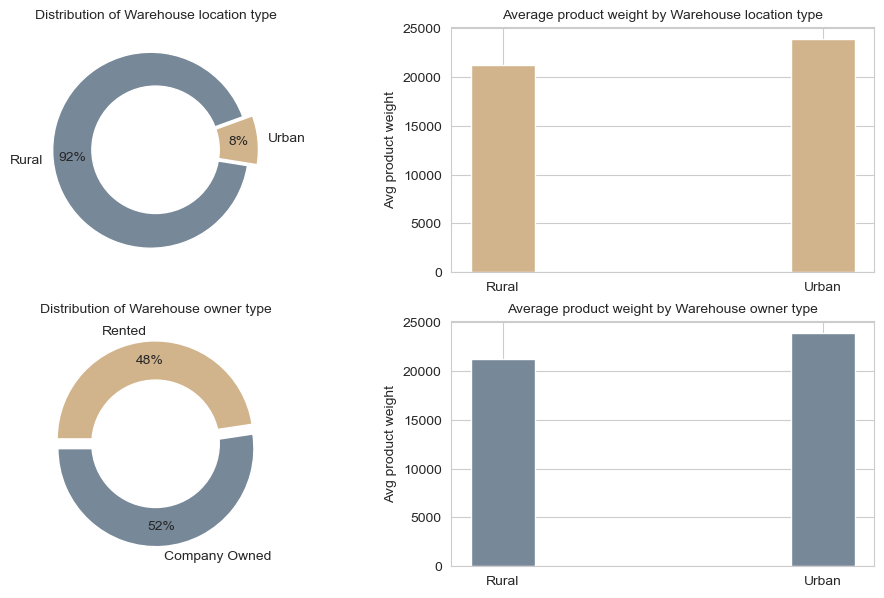

In [90]:
#Warehouse location type & Owner Type
plt.figure(figsize=(12, 7))


# Warehouse location type
# plot 1
ax1 = plt.subplot2grid((2, 2), (0, 0))

print(df.groupby('Location_type')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

df['Location_type'].value_counts().plot(kind = 'pie', colors = ['lightslategrey', 'tan'], autopct='%1.0f%%', explode=(0.05, 0.05),
                                     startangle=20, ylabel=' ', pctdistance=0.8)
centre_circle = plt.Circle((0, 0), 0.65, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Distribution of Warehouse location type', fontsize=10)

#plot 2
ax2 = plt.subplot2grid((2, 2), (0, 1))

x = df.groupby('Location_type')['product_wg_ton'].mean()
plt.bar(x.index, x.values, color='tan', width=0.2)
plt.title('Average product weight by Warehouse location type', fontsize=10)
plt.ylabel('Avg product weight')

# Warehouse Owner Type

# plot 3
ax3 = plt.subplot2grid((2, 2), (1, 0))
print(df.groupby('wh_owner_type')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

df['wh_owner_type'].value_counts().plot(kind = 'pie', colors = ['lightslategrey', 'tan'], autopct='%1.0f%%', explode=(0.05, 0.05),
                                     startangle=180, ylabel=' ', pctdistance=0.8)
centre_circle = plt.Circle((0, 0), 0.65, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Distribution of Warehouse owner type', fontsize=10)

# plot 4
ax4 = plt.subplot2grid((2, 2), (1, 1))

X = df.groupby('wh_owner_type')['product_wg_ton'].mean()
plt.bar(x.index, x.values, color='lightslategrey', width=0.2)
plt.title('Average product weight by Warehouse owner type', fontsize=10)
plt.ylabel('Avg product weight')

plt.show()



Unique values in zone ['North' 'South' 'West' 'East']
  
    zone  product_wg_ton
1  North        88379832
3   West        64877140
2  South        54308548
0   East         3669727
  
Unique values in regional zone ['Zone 5' 'Zone 2' 'Zone 1' 'Zone 6' 'Zone 4' 'Zone 3']
  
  WH_regional_zone  product_wg_ton
5           Zone 6        70085979
4           Zone 5        39154015
3           Zone 4        34419210
1           Zone 2        25540821
2           Zone 3        24590376
0           Zone 1        17444846
  


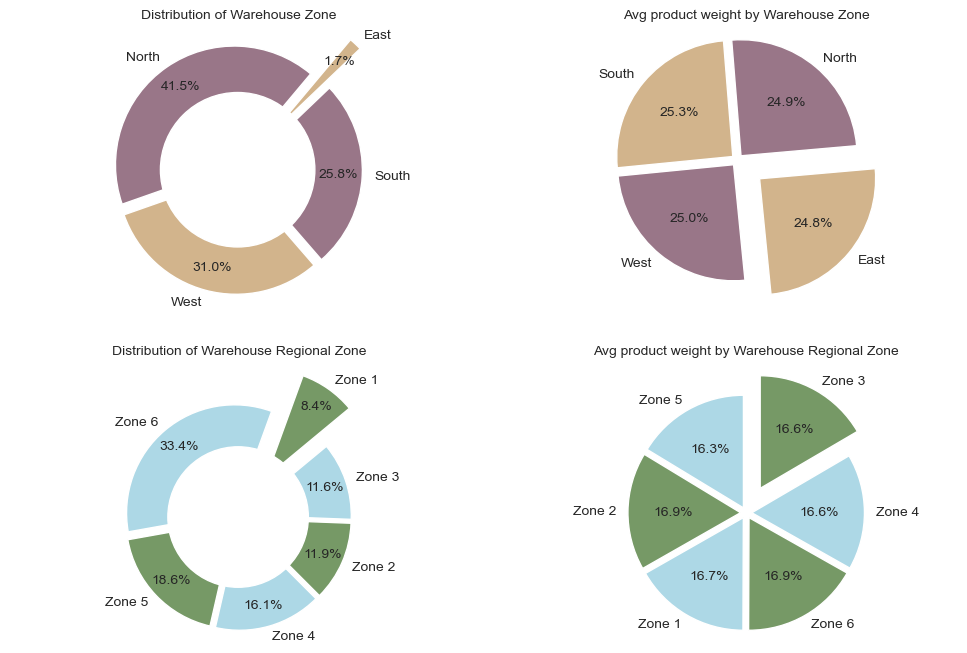

In [91]:
#zone & Regional_zone
print("Unique values in zone" , df['zone'].unique())
print('  ')
print(df.groupby('zone')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

# regional zone

print("Unique values in regional zone" , df['WH_regional_zone'].unique())
print('  ')
print(df.groupby('WH_regional_zone')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

plt.figure(figsize=(12, 8))

# plot 1
ax1 = plt.subplot2grid((2, 2), (0, 0))

df['zone'].value_counts().plot(kind = 'pie', colors = ['#997688', 'tan'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.05, 0.45),
                                     startangle=50, ylabel='  ', pctdistance=0.8)
centre_circle = plt.Circle((0, 0), 0.65, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Warehouse Zone', fontsize=10)
# plot 2
ax2 = plt.subplot2grid((2, 2), (0, 1))


x = df.groupby('zone')['product_wg_ton'].mean()
labels= df['zone'].unique()
plt.pie(x, colors =['#997688', 'tan'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.05, 0.25), startangle=5, labels = labels)
plt.axis('equal')
plt.title('Avg product weight by Warehouse Zone', fontsize=10)

# Regional zone
# plot 3
ax3 = plt.subplot2grid((2, 2), (1, 0))

df['WH_regional_zone'].value_counts().plot(kind = 'pie', colors = ['lightblue', '#769966'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.05, 0.05, 0.05, 0.45),
                                     startangle=70, ylabel='  ', pctdistance=0.8)
centre_circle = plt.Circle((0, 0), 0.65, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Warehouse Regional Zone', fontsize=10)

# plot 4
ax4 = plt.subplot2grid((2, 2), (1, 1))


x = df.groupby('WH_regional_zone')['product_wg_ton'].mean()
labels= df['WH_regional_zone'].unique()
plt.pie(x, colors =['lightblue', '#769966'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.05, 0.05, 0.05, 0.25), startangle=90, labels = labels)
plt.axis('equal')
plt.title('Avg product weight by Warehouse Regional Zone', fontsize=10)

plt.show()

In [92]:
#Electric_supply & temp_reg_mach availability


   temp_reg_mach  product_wg_ton
0              0       163854879
1              1        47380368
  
   electric_supply  product_wg_ton
1                1       131740470
0                0        79494777
  


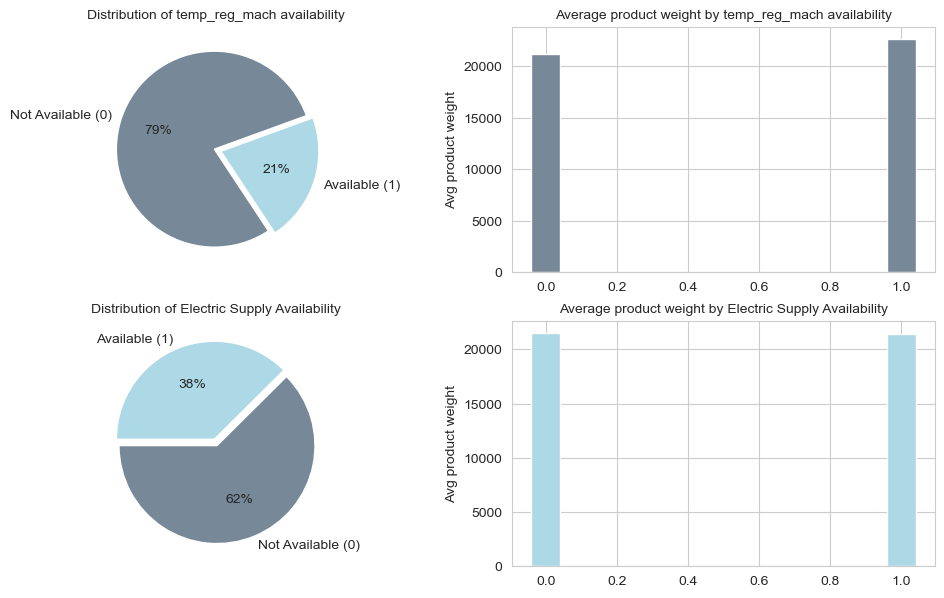

In [93]:
plt.figure(figsize=(12, 7))


# Temperature regulating machine availability
# plot 1
ax1 = plt.subplot2grid((2, 2), (0, 0))

print(df.groupby('temp_reg_mach')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

df['temp_reg_mach'].value_counts().plot(kind = 'pie', colors = ['lightslategrey', 'lightblue'], autopct='%1.0f%%', explode=(0.02, 0.05),
                                     startangle=20, ylabel=' ', labels = ['Not Available (0)', 'Available (1)'])

plt.title('Distribution of temp_reg_mach availability', fontsize=10)

#plot 2
ax2 = plt.subplot2grid((2, 2), (0, 1))

x = df.groupby('temp_reg_mach')['product_wg_ton'].mean()
plt.bar(x.index, x.values, color='lightslategrey', width=0.08)
plt.title('Average product weight by temp_reg_mach availability', fontsize=10)
plt.ylabel('Avg product weight')

# Electric Supply Availability

# plot 3
ax3 = plt.subplot2grid((2, 2), (1, 0))
x = df.groupby('temp_reg_mach')['product_wg_ton'].mean()
plt.bar(x.index, x.values, color='lightslategrey', width=0.08)
plt.title('Average product weight by temp_reg_mach availability', fontsize=10)
plt.ylabel('Avg product weight')

# Electric Supply Availability

# plot 3
ax3 = plt.subplot2grid((2, 2), (1, 0))
print(df.groupby('electric_supply')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

df['electric_supply'].value_counts().plot(kind = 'pie', colors = ['lightslategrey', 'lightblue'], autopct='%1.0f%%', explode=(0.02, 0.05),
                                     startangle=180, ylabel=' ', labels = ['Not Available (0)', 'Available (1)'])

plt.title('Distribution of Electric Supply Availability', fontsize=10)

# plot 4
ax4 = plt.subplot2grid((2, 2), (1, 1))

x = df.groupby('electric_supply')['product_wg_ton'].mean()
plt.bar(x.index, x.values, color='lightblue', width=0.08)
plt.title('Average product weight by Electric Supply Availability', fontsize=10)
plt.ylabel('Avg product weight')

plt.show()


Unique values in Storage issue reported [ 4 17 23 24 18 22  6 13 14 12  0 16 15  9 20 21 31 26  8 11 28  7 30 10
 19  5 29 39 38 37 34 25 36 32 27 33 35]
  
    storage_issue_reported_l3m  product_wg_ton
17                          20        15219213
15                          18        13989792
21                          24        13448710
16                          19        13034958
22                          25        12528533
  


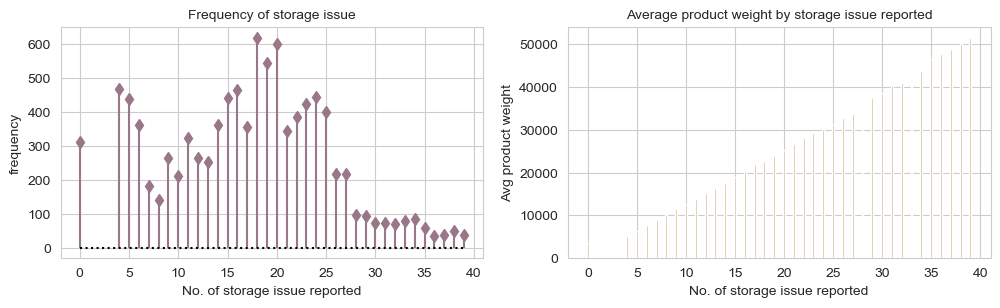

In [94]:
#Storage issue reported in the last 3 months
print("Unique values in Storage issue reported", df['storage_issue_reported_l3m'].unique())
print('  ')
print(df.groupby('storage_issue_reported_l3m')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2).head())
print('  ')

plt.figure(figsize=(12, 3))


# storage issue reported in the last 3 months        
# plot 1

ax1 = plt.subplot2grid((1, 2), (0, 0))

x = df['storage_issue_reported_l3m'].value_counts()

plt.stem(x.index, x.values, linefmt='#997688', basefmt='k:', markerfmt='d')
plt.xlabel('No. of storage issue reported')
plt.ylabel('frequency')
plt.title('Frequency of storage issue', fontsize=10)

# plot 2
ax2 = plt.subplot2grid((1, 2), (0, 1))

x = df.groupby('storage_issue_reported_l3m')['product_wg_ton'].mean()
plt.bar(x.index, x.values, color='tan', width=0.2)
plt.title('Average product weight by storage issue reported', fontsize=10)
plt.xlabel('No. of storage issue reported')
plt.ylabel('Avg product weight')

plt.show()

Unique values in no. of warehouse breakdown [3 6 5 4 2 0 1]
  
   wh_breakdown_l3m  product_wg_ton
3                 3        43388964
2                 2        42508336
6                 6        39209142
5                 5        38692816
4                 4        38678920
  


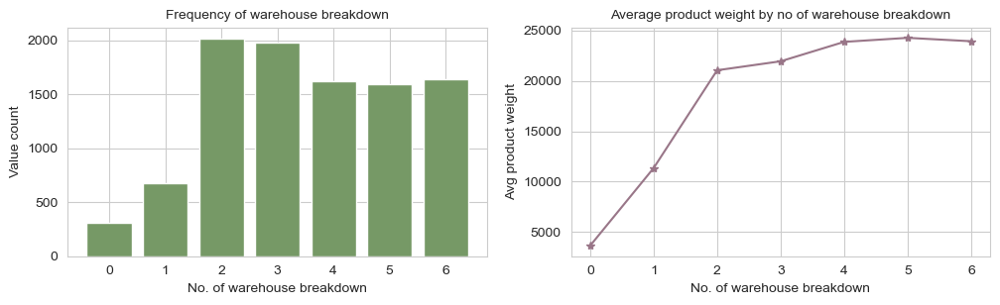

In [95]:
#No. of warehouse breakdown in the last 3 months
print("Unique values in no. of warehouse breakdown" , df['wh_breakdown_l3m'].unique())
print('  ')
print(df.groupby('wh_breakdown_l3m')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2).head())
print('  ')

plt.figure(figsize=(12, 3))


# no. of warehouse breakdown in the last 3 months        
# plot 1

ax1 = plt.subplot2grid((1, 2), (0, 0))

x = df['wh_breakdown_l3m'].value_counts()

plt.bar(x.index, x.values, color='#769966')
plt.xlabel('No. of warehouse breakdown')
plt.ylabel('Value count')
plt.title('Frequency of warehouse breakdown', fontsize=10)

# #plot 2
ax2 = plt.subplot2grid((1, 2), (0, 1))

x = df.groupby('wh_breakdown_l3m')['product_wg_ton'].mean()
plt.plot(x.index, x.values, color='#997688', marker='*')
plt.xlabel('No. of warehouse breakdown')
plt.ylabel('Avg product weight')
plt.title('Average product weight by no of warehouse breakdown', fontsize=10)

plt.show()

In [96]:
df[['zone','product_wg_ton']].groupby(['zone']).mean().sort_values(by='product_wg_ton',ascending=False).reset_index()

,zone,product_wg_ton
0,North,21667.03
1,South,21440.41
2,East,21335.62
3,West,21278.17


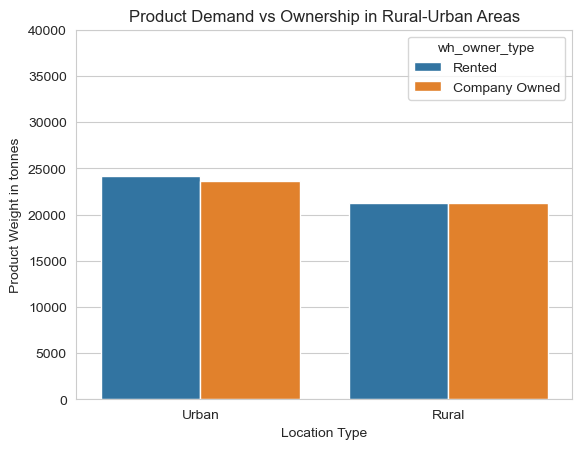

,Location_type,wh_owner_type,product_wg_ton,distributor_num
0,Urban,Rented,24167.36,42.78
1,Urban,Company Owned,23678.27,41.12
2,Rural,Company Owned,21287.16,42.05
3,Rural,Rented,21248.44,42.26


In [97]:
R2=df[['Location_type','wh_owner_type','product_wg_ton','distributor_num'] ].groupby(
    ['Location_type', 'wh_owner_type']).mean().sort_values(by='product_wg_ton',ascending=False).reset_index()
sns.barplot(x='Location_type', y='product_wg_ton', hue='wh_owner_type', data=R2)
plt.ylim(0,40000)
plt.title('Product Demand vs Ownership in Rural-Urban Areas')
plt.xlabel('Location Type')
plt.ylabel('Product Weight in tonnes')
plt.show()
R2

In [98]:
df[['zone','WH_capacity_size']].value_counts()

zone   WH_capacity_size
North  Large               2178
West   Mid                 1349
South  Mid                 1288
North  Mid                 1165
West   Large               1138
North  Small                736
South  Large                653
       Small                592
West   Small                562
East   Mid                   93
       Small                 48
       Large                 31
Name: count, dtype: int64

In [99]:
round(df[['zone','retail_shop_num','distributor_num','Competitor_in_mkt','govt_check_l3m']].groupby('zone').mean(),2)

,retail_shop_num,distributor_num,Competitor_in_mkt,govt_check_l3m
zone,,,,
East,4827.67,41.48,5.15,22.30
North,5010.90,41.87,2.99,19.79
South,4975.71,42.14,2.50,20.56
West,4859.14,42.52,3.62,16.06


Unique values in Government certification grades ['A' 'A+' 'B' 'C' 'B+' 'NIL']
  
  approved_wh_govt_certificate  product_wg_ton
4                            C        43923837
0                            A        43184566
1                           A+        42733946
3                           B+        40725697
2                            B        39538093
5                          NIL         1129108
  


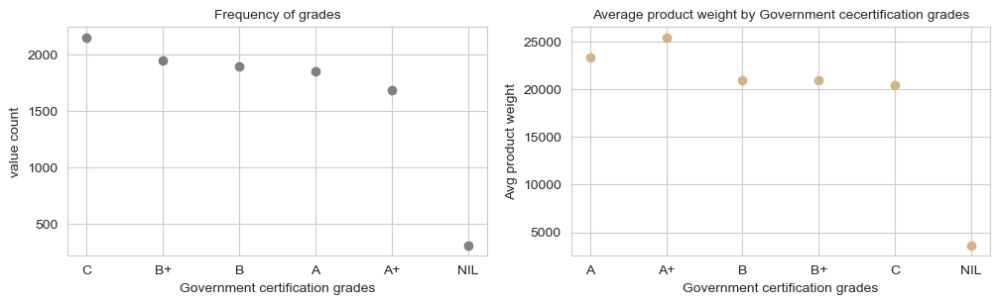

In [100]:
#Type of approval by government
print("Unique values in Government certification grades", df['approved_wh_govt_certificate'].unique())
print('  ')
print(df.groupby('approved_wh_govt_certificate')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

plt.figure(figsize=(12, 3))

# Government certification
# plot 1
ax1 = plt.subplot2grid((1, 2), (0, 0))

x = df['approved_wh_govt_certificate'].value_counts()

plt.scatter(x.index, x.values, color='grey' , marker='o')
plt.xlabel('Government certification grades')
plt.title('Frequency of grades', fontsize=10)
plt.ylabel('value count')

# #plot 2
ax2 = plt.subplot2grid((1, 2), (0, 1))

x = df.groupby('approved_wh_govt_certificate')['product_wg_ton'].mean()

plt.scatter(x.index, x.values, color='tan', marker='o')
plt.title('Average product weight by Government cecertification grades', fontsize=10)
plt.xlabel('Government certification grades')
plt.ylabel('Avg product weight')

plt.show()

Unique values in govt checking in last 3 months [17 22  3  6 24 11  9 12 21 19 14 23 27 28 26 29  1 13 32  7 15 20  2 25
 30 18 10 31  5  4 16  8]
  
    govt_check_l3m  product_wg_ton
25              26        24024147
22              23        14830443
18              19        13906313
13              14        12509031
27              28        12482404
  


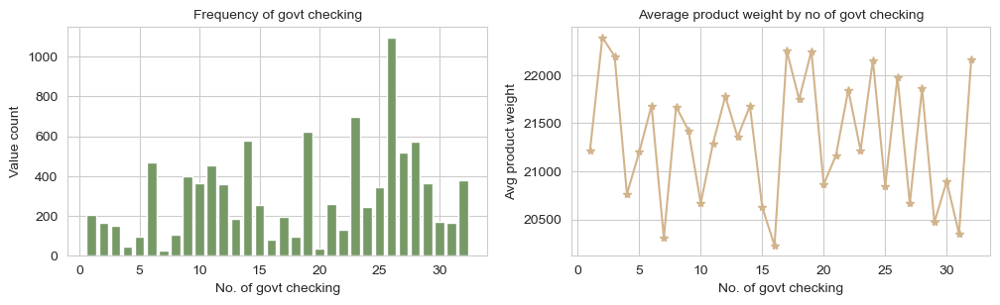

In [101]:
#govt checking in last 3 months
print("Unique values in govt checking in last 3 months" , df['govt_check_l3m'].unique())
print('  ')
print(df.groupby('govt_check_l3m')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2).head())
print('  ')

plt.figure(figsize=(12, 3))

# plot 1

ax1 = plt.subplot2grid((1, 2), (0, 0))

x = df['govt_check_l3m'].value_counts()

plt.bar(x.index, x.values, color='#769966')
plt.xlabel('No. of govt checking')
plt.ylabel('Value count')
plt.title('Frequency of govt checking', fontsize=10)

# #plot 2
ax2 = plt.subplot2grid((1, 2), (0, 1))

x = df.groupby('govt_check_l3m')['product_wg_ton'].mean()
plt.plot(x.index, x.values, color='tan', marker='*')
plt.xlabel('No. of govt checking')
plt.ylabel('Avg product weight')
plt.title('Average product weight by no of govt checking', fontsize=10)

plt.show()

Unique values in No. of workers [31.  37.  35.  27.  23.  36.  19.  22.  24.  30.  29.  26.  40.  34.
 16.  44.  28.  38.  18.  25.  11.  21.  17.  32.  12.  33.  45.  20.
 41.  46.5 15.  46.  39.  43.  42.  14.  13.  10.5]
  
    workers_num  product_wg_ton
18        28.00        18756433
17        27.00        11944810
16        26.00        11416948
15        25.00        11190444
19        29.00        10935113
  


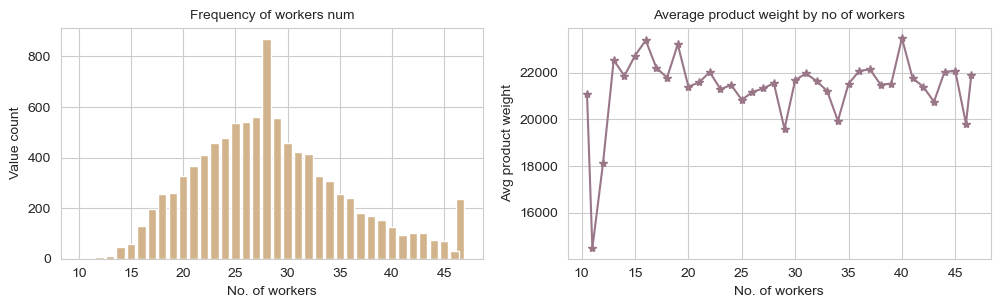

In [102]:
#No. of workers
# workers_num
print("Unique values in No. of workers" , df['workers_num'].unique())
print('  ')
print(df.groupby('workers_num')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2).head())
print('  ')

plt.figure(figsize=(12, 3))

# plot 1

ax1 = plt.subplot2grid((1, 2), (0, 0))

x = df['workers_num'].value_counts()

plt.bar(x.index, x.values, color='tan')
plt.xlabel('No. of workers')
plt.ylabel('Value count')
plt.title('Frequency of workers num', fontsize=10)

# #plot 2
ax2 = plt.subplot2grid((1, 2), (0, 1))

x = df.groupby('workers_num')['product_wg_ton'].mean()
plt.plot(x.index, x.values, color='#997688', marker='*')
plt.xlabel('No. of workers')
plt.ylabel('Avg product weight')
plt.title('Average product weight by no of workers', fontsize=10)

plt.show()

Unique values in Warehouse capacity size ['Large' 'Mid' 'Small']
  
  WH_capacity_size  product_wg_ton
0            Large        85509618
1              Mid        84550407
2            Small        41175222
  
Unique values in Transport issue in 1 year [0 1 2]
  
   transport_issue_l1y  product_wg_ton
0                    0       137999369
1                    1        46505038
2                    2        26730840
  


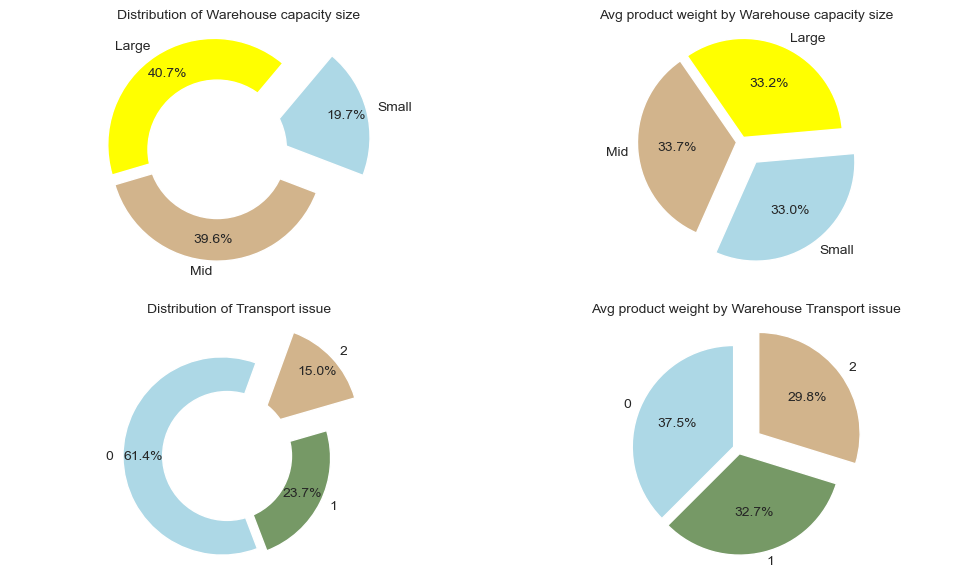

In [103]:
#Warehouse capacity size & Transport issue
# Warehouse capacity size
print("Unique values in Warehouse capacity size", df['WH_capacity_size'].unique())
print('  ')
print(df.groupby('WH_capacity_size')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')
# Transport issue in 1 year
print("Unique values in Transport issue in 1 year", df['transport_issue_l1y'].unique())
print('  ')
print(df.groupby('transport_issue_l1y')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

plt.figure(figsize=(12, 7))

# Warehouse capacity size
# plot 1
ax1 = plt.subplot2grid((2, 2), (0, 0))

df['WH_capacity_size'].value_counts().plot(kind = 'pie', colors = ['yellow', 'tan', 'lightblue'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.45),
                                     startangle=50, ylabel='  ', pctdistance=0.8)
centre_circle = plt.Circle((0, 0), 0.65, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Warehouse capacity size', fontsize=10)

# plot 2
ax2 = plt.subplot2grid((2, 2), (0, 1))
x = df.groupby('WH_capacity_size')['product_wg_ton'].mean()
labels= df['WH_capacity_size'].unique()
plt.pie(x, colors =['yellow', 'tan', 'lightblue'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.25), startangle=5, labels = labels)
plt.axis('equal')
plt.title('Avg product weight by Warehouse capacity size', fontsize=10)

# transport issue in 1 year
# plot 3
ax3 = plt.subplot2grid((2, 2), (1, 0))

df['transport_issue_l1y'].value_counts().plot(kind = 'pie', colors = ['lightblue', '#769966', 'tan'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.45),
                                     startangle=70, ylabel='  ', pctdistance=0.8)
centre_circle = plt.Circle((0, 0), 0.65, fc = 'white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Distribution of Transport issue', fontsize=10)

# plot 4
ax4 = plt.subplot2grid((2, 2), (1, 1))


x = df.groupby('transport_issue_l1y')['product_wg_ton'].mean()
labels= df['transport_issue_l1y'].unique()
plt.pie(x, colors =['lightblue', '#769966', 'tan'], autopct='%1.1f%%', explode=(0.05, 0.05, 0.25), startangle=90, labels = labels)
plt.axis('equal')
plt.title('Avg product weight by Warehouse Transport issue', fontsize=10)

plt.show()


Unique values in No. of competitors in the market [4. 2. 3. 7. 5. 1. 6.]
  
   Competitor_in_mkt  product_wg_ton
1               2.00        72962584
2               3.00        61055288
3               4.00        55558048
4               5.00        11478188
5               6.00         4428766
0               1.00         3472440
6               7.00         2279933
  


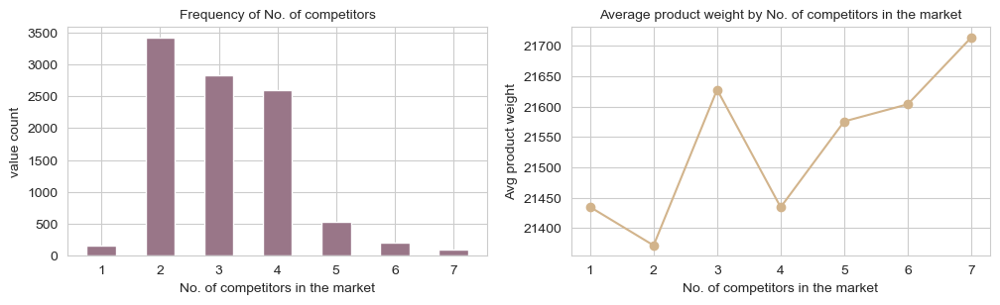

In [104]:
#Competitor_in_mkt
print("Unique values in No. of competitors in the market", df['Competitor_in_mkt'].unique())
print('  ')
print(df.groupby('Competitor_in_mkt')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2))
print('  ')

plt.figure(figsize=(12, 3))

# Government certification
# plot 1
ax1 = plt.subplot2grid((1, 2), (0, 0))

x = df['Competitor_in_mkt'].value_counts()

plt.bar(x.index, x.values, color='#997688', width=0.5)
plt.xlabel('No. of competitors in the market')
plt.title('Frequency of No. of competitors', fontsize=10)
plt.ylabel('value count')

# #plot 2
ax2 = plt.subplot2grid((1, 2), (0, 1))

x = df.groupby('Competitor_in_mkt')['product_wg_ton'].mean()

plt.plot(x.index, x.values, color='tan', marker='o')
plt.title('Average product weight by No. of competitors in the market', fontsize=10)
plt.xlabel('No. of competitors in the market')
plt.ylabel('Avg product weight')

plt.show()


Unique values in No. distributors [47 64 37 38 45 26 68 50 28 19 49 25 21 59 17 30 53 29 44 62 54 40 55 16
 33 23 63 48 35 65 24 34 27 51 31 58 66 43 18 60 41 22 67 32 69 57 52 61
 36 20 70 56 46 39 42 15]
  
    distributor_num  product_wg_ton
6                21         4695023
13               28         4541284
18               33         4465383
23               38         4400901
22               37         4388885
  


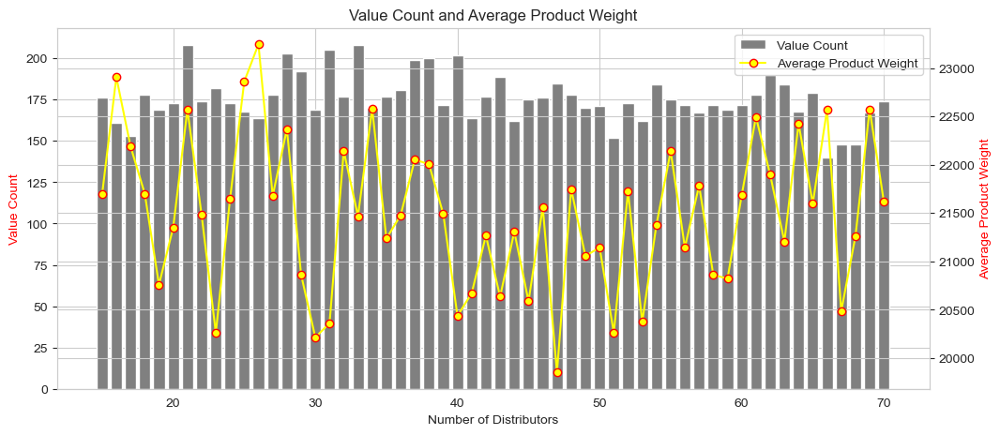

In [105]:
#No. of Distributors
# distributor_num
print("Unique values in No. distributors", df['distributor_num'].unique())
print('  ')
print(df.groupby('distributor_num')['product_wg_ton'].sum().reset_index().sort_values(by='product_wg_ton', ascending=False).round(2).head())
print('  ')


x = df['distributor_num'].value_counts().sort_index()

avg_product_weight = df.groupby('distributor_num')['product_wg_ton'].mean()

fig, ax1 = plt.subplots(figsize=(12, 5))

# Plotting the line plot for value count
ax1.bar(x.index, x.values, color='grey',  label='Value Count')
ax1.set_ylabel('Value Count', color='red')

# Creating a secondary y-axis and plotting the bar graph for average product weight
ax2 = ax1.twinx()
ax2.plot(avg_product_weight.index, avg_product_weight.values, color='yellow', marker='o', markeredgecolor = 'red', label='Average Product Weight')
ax2.set_ylabel('Average Product Weight', color='red')

# Adding legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)

# Setting labels and title
ax1.set_xlabel('Number of Distributors')
plt.title('Value Count and Average Product Weight')


plt.show()

In [106]:
#Distance from hub
df_copy = df.copy()

In [107]:
print("Total no. of unique values in Distance from hub", len(df['dist_from_hub'].unique()))
print('  ')

# define bin edges : 
# Retail shop number : min value = 55, max value = 271

bins =[55, 80, 105, 130, 155, 180, 205, 230, 255]



# cut the column into bins
df_copy['bins'] = pd.cut(df_copy['dist_from_hub'], bins)

bin_counts = df_copy['bins'].value_counts().sort_index()

# Create a DataFrame from bin_counts
table_df = pd.DataFrame({'Bin': bin_counts.index, 'Count': bin_counts.values})

# Display the table
print(table_df)

Total no. of unique values in Distance from hub 217
  
          Bin  Count
0    (55, 80]   1146
1   (80, 105]   1085
2  (105, 130]   1151
3  (130, 155]   1146
4  (155, 180]   1124
5  (180, 205]   1101
6  (205, 230]   1085
7  (230, 255]   1203


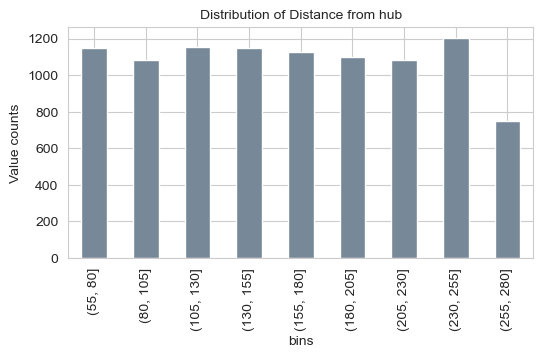

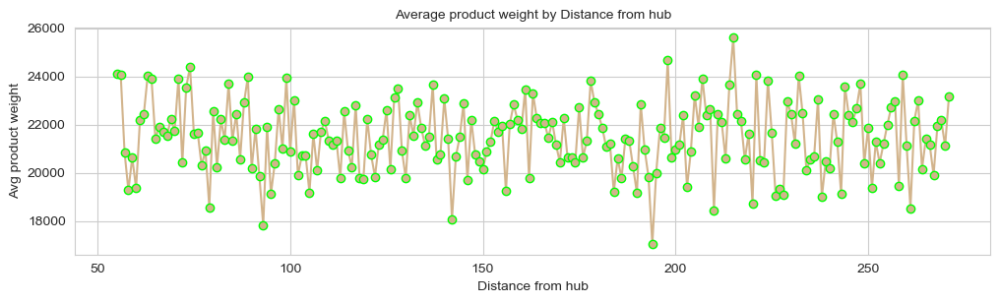

In [108]:
plt.figure(figsize=(6, 3))

# plot 1
#ax1 = plt.subplot2grid((1, 2), (0, 0)) 

bin =[55, 80, 105, 130, 155, 180, 205, 230, 255, 280]

# cut the column into bins
df_copy['bins'] = pd.cut(df_copy['dist_from_hub'], bins=bin)

#plot bargraph
df_copy['bins'].value_counts().sort_index().plot(kind='bar', color='lightslategrey')

plt.title('Distribution of Distance from hub', fontsize=10)
plt.ylabel('Value counts')
plt.show()


avg_product_weight = df.groupby('dist_from_hub')['product_wg_ton'].mean()
plt.figure(figsize=(12, 3))
plt.plot(avg_product_weight.index, avg_product_weight.values, color='tan', marker='o', markeredgecolor = 'lime')
plt.title('Average product weight by Distance from hub', fontsize=10)
plt.xlabel('Distance from hub')
plt.ylabel('Avg product weight')

plt.show()


In [109]:
#Retail shop number
print("Total no. of unique values in no. of retail shops", len(df['retail_shop_num'].unique()))
print('  ')

# define bin edges : 
# Retail shop number : min value = 1821, max value = 11008

bins =[1500, 3000, 4500, 6000, 7500, 9000, 10500, 12000]

# cut the column into bins
df_copy['bins'] = pd.cut(df_copy['retail_shop_num'], bins)

bin_counts = df_copy['bins'].value_counts().sort_index()

# Create a DataFrame from bin_counts
table_df = pd.DataFrame({'Bin': bin_counts.index, 'Count': bin_counts.values})

# Display the table
print(table_df)

Total no. of unique values in no. of retail shops 3358
  
              Bin  Count
0    (1500, 3000]    134
1    (3000, 4500]   3174
2    (4500, 6000]   5135
3    (6000, 7500]   1390
4    (7500, 9000]      0
5   (9000, 10500]      0
6  (10500, 12000]      0


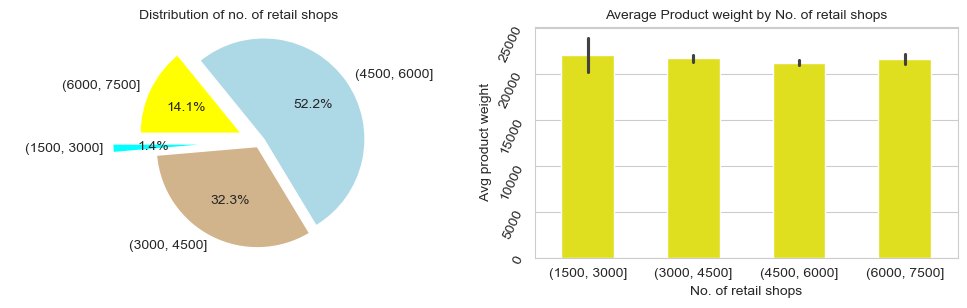

In [110]:
plt.figure(figsize=(12, 3))

# plot 1

ax1 = plt.subplot2grid((1, 2), (0, 0)) 

# define bin edges
bins =[1500, 3000, 4500, 6000, 7500]

# cut the column into bins
df_copy['bins'] = pd.cut(df_copy['retail_shop_num'], bins)

#plot bargraph

df_copy['bins'].value_counts().sort_index().plot(kind='pie',  colors = ['cyan', 'tan', 'lightblue', 'yellow'], autopct='%1.1f%%', explode=(0.45, 0.05, 0.05, 0.2),
                                     startangle=180, ylabel='  ')
plt.axis('equal')
plt.title('Distribution of no. of retail shops', fontsize=10)


# plot 1

ax2 = plt.subplot2grid((1, 2), (0, 1)) 
sns.barplot(data=df_copy, x='bins', y='product_wg_ton', color='yellow', width=0.5)
plt.ylabel(' Avg product weight')
plt.xlabel('No. of retail shops')
plt.title('Average Product weight by No. of retail shops', fontsize=10)
plt.yticks(rotation=65)
plt.show()


## Model Building 

### Data Pre-processing

In [111]:
# Creating a copy of original dataframe
df_new=df.copy()
print("Shape of data before dropping the columns",df_new.shape)


Shape of data before dropping the columns (9833, 22)


In [112]:
# Checking if duplicate values present in dataset
df_new.duplicated().sum()

0

In [113]:
##Handling Missing and Incorrect value
# check count of null records in each column
df_new.isnull().sum()

Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
wh_owner_type                   0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
wh_est_year                     0
storage_issue_reported_l3m      0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
product_wg_ton                  0
dtype: int64

In [114]:
#rounding the percentage to 2 digits
round((df.isnull().sum()/df.shape[0])*100,2)

Location_type                  0.00
WH_capacity_size               0.00
zone                           0.00
WH_regional_zone               0.00
num_refill_req_l3m             0.00
transport_issue_l1y            0.00
Competitor_in_mkt              0.00
retail_shop_num                0.00
wh_owner_type                  0.00
distributor_num                0.00
flood_impacted                 0.00
flood_proof                    0.00
electric_supply                0.00
dist_from_hub                  0.00
workers_num                    0.00
wh_est_year                    0.00
storage_issue_reported_l3m     0.00
temp_reg_mach                  0.00
approved_wh_govt_certificate   0.00
wh_breakdown_l3m               0.00
govt_check_l3m                 0.00
product_wg_ton                 0.00
dtype: float64

In [115]:
##Outlier treatment
data_outlier=df_new.copy()

In [116]:
# Defining a funtion to remove outliers
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [117]:
#capping and flooring of outliers with upper and lower bounds respectively
for column in data_outlier: 
    if data_outlier[column].dtype != 'object':
        lr,ur=remove_outlier(data_outlier[column])
        data_outlier[column]=np.where(data_outlier[column]>ur,ur,data_outlier[column])
        data_outlier[column]=np.where(data_outlier[column]<lr,lr,data_outlier[column])

<Axes: title={'center': 'Without Outliers'}>

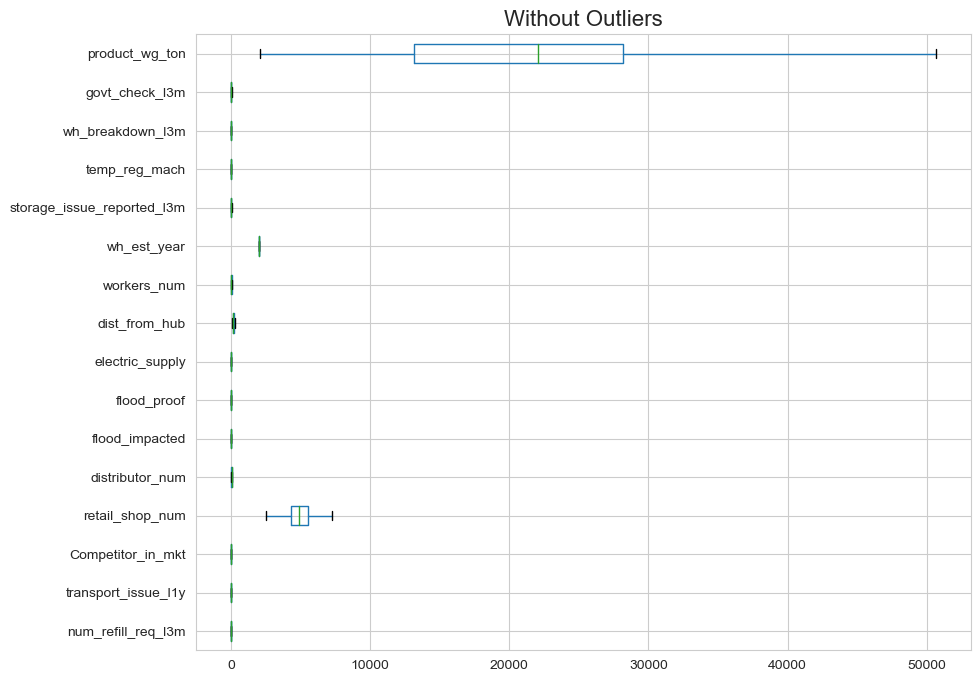

In [118]:
#plotting boxplots after outlier treatment
plt.figure(figsize=(10,8))
plt.title('Without Outliers',fontsize=16)
data_outlier.boxplot(vert=0)

### Feature Engineering

We will split the train and test data before transforming , so that there will not be problem of data leakage. Our model will be trained on training dataset only.

In [119]:
#copying the outlier treated dataframe into new variable
data_feature = data_outlier.copy()

In [120]:
data_feature.drop(['Location_type','zone','WH_regional_zone'], axis=1, inplace=True)
print("Shape of data after removing Power",data_feature.shape) 

Shape of data after removing Power (9833, 19)


In [121]:
##Dividing dataset into data matrix and target variable


In [122]:
# Copy target into the y dataframe. 
y= data_feature['product_wg_ton'].values

# Copy all the predictor variables into X dataframe
x = data_feature.drop(['product_wg_ton'], axis=1)

In [123]:
print("Shape of X matrix is: ",x.shape)
print("Size of y : ",len(y))

Shape of X matrix is:  (9833, 18)
Size of y :  9833


In [124]:
#Splitting x and y into train and test dataset

X_train, X_test, y_train, y_test= train_test_split(x,y,test_size=0.30,random_state=1)
print("shape of train :", X_train.shape,y_train.shape)
print("shape of test :", X_test.shape,y_test.shape)

shape of train : (6883, 18) (6883,)
shape of test : (2950, 18) (2950,)


We are transforming categorical feature into numerical using one hot encoding.  Therefore we are working on enginnered feature rather than Name itself

In [126]:

'''one hot encoding for categorical features: WH_capacity_size'''
vectorizer=CountVectorizer()

X_train_WH_capacity_size = vectorizer.fit_transform(X_train['WH_capacity_size'].values)
#fit will happen on train  data then we use the fitted CountVectorizer to convert the text to vector

X_test_WH_capacity_size = vectorizer.transform(X_test['WH_capacity_size'].values)


print("WH_capacity_size after encoding")
print(X_train_WH_capacity_size.shape, y_train.shape)

print(X_test_WH_capacity_size.shape, y_test.shape)
print("="*100)


'''one hot encoding for categorical features: wh_owner_type'''
vectorizer=CountVectorizer()

X_train_wh_owner_type = vectorizer.fit_transform(X_train['wh_owner_type'].values)
#fit will happen on train  data then we use the fitted CountVectorizer to convert the text to vector

X_test_wh_owner_type = vectorizer.transform(X_test['wh_owner_type'].values)


print("wh_owner_type after encoding")
print(X_train_wh_owner_type.shape, y_train.shape)

print(X_test_wh_owner_type.shape, y_test.shape)
print("="*100)

'''one hot encoding for categorical features: wh_owner_type'''
vectorizer=CountVectorizer()

X_train_wh_owner_type = vectorizer.fit_transform(X_train['wh_owner_type'].values)
#fit will happen on train  data then we use the fitted CountVectorizer to convert the text to vector

X_test_wh_owner_type = vectorizer.transform(X_test['wh_owner_type'].values)


print("wh_owner_type after encoding")
print(X_train_wh_owner_type.shape, y_train.shape)

print(X_test_wh_owner_type.shape, y_test.shape)
print("="*100)

'''one hot encoding for categorical features: approved_wh_govt_certificate'''
vectorizer=CountVectorizer()

X_train_approved_wh_govt_certificate = vectorizer.fit_transform(X_train['approved_wh_govt_certificate'].values)
#fit will happen on train  data then we use the fitted CountVectorizer to convert the text to vector

X_test_approved_wh_govt_certificate = vectorizer.transform(X_test['approved_wh_govt_certificate'].values)


print("approved_wh_govt_certificate after encoding")
print(X_train_approved_wh_govt_certificate.shape, y_train.shape)

print(X_test_approved_wh_govt_certificate.shape, y_test.shape)
print("="*100)

'''one hot encoding for categorical features: wh_est_year'''
vectorizer=CountVectorizer()

X_train_wh_est_year = vectorizer.fit_transform(X_train['wh_est_year'].values)
#fit will happen on train  data then we use the fitted CountVectorizer to convert the text to vector

X_test_wh_est_year = vectorizer.transform(X_test['wh_est_year'].values)


print("wh_est_year converted after encoding")
print(X_train_wh_est_year.shape, y_train.shape)

print(X_test_wh_est_year.shape, y_test.shape)
print("="*100)

WH_capacity_size after encoding
(6883, 3) (6883,)
(2950, 3) (2950,)
wh_owner_type after encoding
(6883, 3) (6883,)
(2950, 3) (2950,)
wh_owner_type after encoding
(6883, 3) (6883,)
(2950, 3) (2950,)
approved_wh_govt_certificate after encoding
(6883, 1) (6883,)
(2950, 1) (2950,)


AttributeError: 'numpy.float64' object has no attribute 'lower'

In [127]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()

'''Encoding Numerical features: num_refill_req_l3m'''
x_train_num_refill_req_l3m = normalizer.fit_transform(X_train['num_refill_req_l3m'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliimmeanser to normalise the test data
x_test_num_refill_req_l3m = normalizer.transform(X_test['num_refill_req_l3m'].values.reshape(-1,1))

'''Encoding Numerical features: transport_issue_l1y'''
x_train_transport_issue_l1y = normalizer.fit_transform(X_train['transport_issue_l1y'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_transport_issue_l1y = normalizer.transform(X_test['transport_issue_l1y'].values.reshape(-1,1))

'''Encoding Numerical features: Competitor_in_mkt'''
x_train_Competitor_in_mkt = normalizer.fit_transform(X_train['Competitor_in_mkt'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_Competitor_in_mkt = normalizer.transform(X_test['Competitor_in_mkt'].values.reshape(-1,1))

'''Encoding Numerical features: retail_shop_num'''
x_train_retail_shop_num = normalizer.fit_transform(X_train['retail_shop_num'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_retail_shop_num = normalizer.transform(X_test['retail_shop_num'].values.reshape(-1,1))

'''Encoding Numerical features: Competitor_in_mkt'''
x_train_Competitor_in_mkt = normalizer.fit_transform(X_train['Competitor_in_mkt'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_Competitor_in_mkt = normalizer.transform(X_test['Competitor_in_mkt'].values.reshape(-1,1))

'''Encoding Numerical features: distributor_num'''
x_train_distributor_num = normalizer.fit_transform(X_train['distributor_num'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_distributor_num = normalizer.transform(X_test['distributor_num'].values.reshape(-1,1))

'''Encoding Numerical features: flood_impacted'''
x_train_flood_impacted = normalizer.fit_transform(X_train['flood_impacted'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_flood_impacted = normalizer.transform(X_test['flood_impacted'].values.reshape(-1,1))

'''Encoding Numerical features: flood_proof'''
x_train_flood_proof = normalizer.fit_transform(X_train['flood_proof'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_flood_proof = normalizer.transform(X_test['flood_proof'].values.reshape(-1,1))

'''Encoding Numerical features: electric_supply'''
x_train_electric_supply = normalizer.fit_transform(X_train['electric_supply'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_electric_supply = normalizer.transform(X_test['electric_supply'].values.reshape(-1,1))

'''Encoding Numerical features: dist_from_hub'''
x_train_dist_from_hub = normalizer.fit_transform(X_train['dist_from_hub'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_dist_from_hub = normalizer.transform(X_test['dist_from_hub'].values.reshape(-1,1))

'''Encoding Numerical features: workers_num'''
x_train_workers_num = normalizer.fit_transform(X_train['workers_num'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_workers_num = normalizer.transform(X_test['workers_num'].values.reshape(-1,1))

'''Encoding Numerical features: wh_est_year'''
x_train_wh_est_year = normalizer.fit_transform(X_train['wh_est_year'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_wh_est_year = normalizer.transform(X_test['wh_est_year'].values.reshape(-1,1))

'''Encoding Numerical features: storage_issue_reported_l3m'''
x_train_storage_issue_reported_l3m = normalizer.fit_transform(X_train['storage_issue_reported_l3m'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_storage_issue_reported_l3m = normalizer.transform(X_test['storage_issue_reported_l3m'].values.reshape(-1,1))

'''Encoding Numerical features: temp_reg_mach'''
x_train_temp_reg_mach = normalizer.fit_transform(X_train['temp_reg_mach'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_temp_reg_mach = normalizer.transform(X_test['temp_reg_mach'].values.reshape(-1,1))

'''Encoding Numerical features: wh_breakdown_l3m'''
x_train_wh_breakdown_l3m = normalizer.fit_transform(X_train['wh_breakdown_l3m'].values.reshape(-1,1))
#fit will happen on train  data then we use the fitted normaliser to normalise the test data
x_test_wh_breakdown_l3m = normalizer.transform(X_test['wh_breakdown_l3m'].values.reshape(-1,1))





In [128]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [129]:
Y_train=df.product_wg_ton

In [131]:
from scipy.sparse import hstack,coo_matrix

X_tr=hstack(( X_train_WH_capacity_size,X_train_WH_capacity_size,X_train_wh_owner_type,X_train_approved_wh_govt_certificate,x_train_num_refill_req_l3m.reshape(-1,1),x_train_transport_issue_l1y.reshape(-1,1),x_train_Competitor_in_mkt.reshape(-1,1),x_train_retail_shop_num.reshape(-1,1),x_train_Competitor_in_mkt.reshape(-1,1),x_train_distributor_num.reshape(-1,1),x_train_flood_impacted.reshape(-1,1),x_train_flood_proof.reshape(-1,1),x_train_electric_supply.reshape(-1,1),x_train_dist_from_hub.reshape(-1,1),x_train_workers_num.reshape(-1,1),x_train_wh_est_year.reshape(-1,1),x_train_storage_issue_reported_l3m.reshape(-1,1),x_train_temp_reg_mach.reshape(-1,1),x_train_wh_breakdown_l3m.reshape(-1,1))).tocsr()

X_te=hstack(( X_test_WH_capacity_size,X_train_WH_capacity_size,X_test_wh_owner_type,X_train_approved_wh_govt_certificate,x_test_num_refill_req_l3m.reshape(-1,1),x_test_transport_issue_l1y.reshape(-1,1),x_test_Competitor_in_mkt.reshape(-1,1),x_test_retail_shop_num.reshape(-1,1),x_test_Competitor_in_mkt.reshape(-1,1),x_test_distributor_num.reshape(-1,1),x_test_flood_impacted.reshape(-1,1) ,x_test_flood_proof.reshape(-1,1),x_test_electric_supply.reshape(-1,1),x_test_dist_from_hub.reshape(-1,1),x_test_workers_num.reshape(-1,1),x_test_wh_est_year.reshape(-1,1),x_test_storage_issue_reported_l3m.reshape(-1,1),x_test_temp_reg_mach.reshape(-1,1),x_test_wh_breakdown_l3m.reshape(-1,1))).tocsr()

print("Final Data matrix set ")
print(X_tr.shape, y_train.shape)


print(X_te.shape, y_test.shape)
print("*"*100)

ValueError: blocks[0,:] has incompatible row dimensions. Got blocks[0,1].shape[0] == 6883, expected 2950.

In [132]:
#Implementation of Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score

LR=LinearRegression()
LR.fit(X_tr,y_train)
LR_R2_train=round(LR.score(X_tr,y_train),3)
print("Training score :",LR_R2_train)
y_pred=LR.predict(X_te)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
LR_R2_test=r2_score(y_test, y_pred)
# The coefficient of determination: 1 is perfect prediction
print('Test score: %.2f'% LR_R2_test)

Training score : 0.12


NameError: name 'X_te' is not defined

In [133]:
print("The coefficient of line is {} and the intercept value is {}".format(LR.coef_,LR.intercept_))

The coefficient of line is [-4.14898376e+01  9.37834882e+01 -5.22936507e+01 -4.14898376e+01
  9.37834882e+01 -5.22936507e+01 -4.94779096e+01 -4.94779096e+01
  4.94779096e+01 -6.09165643e+03 -1.17522100e+03 -3.40428172e+03
  9.81422285e-12  9.81422285e-12  9.81422285e-12  9.81422285e-12
  0.00000000e+00  0.00000000e+00  3.20121532e+01  9.81422285e-12
  9.81422285e-12  9.81422285e-12  6.09165643e+03  0.00000000e+00
  6.09165643e+03] and the intercept value is 12002.708032018973


In [134]:
plt.figure(figsize= (10,5))
plt.scatter(y_test, LR.predict(X_te))

NameError: name 'X_te' is not defined

<Figure size 1000x500 with 0 Axes>

In [135]:
def MAPE_calculation(y_true,y_pred):
        y_true,y_pred=np.array(y_true),np.array(y_pred)
        return np.mean(np.abs((y_true-y_pred)/y_true))*100

In [136]:
LR_MAPE_train=MAPE_calculation(y_train,LR.predict(X_tr))
LR_MAPE_test=MAPE_calculation(y_test,y_pred)
print("The MAPE for train dataset is: ",LR_MAPE_train)
print("The MAPE for test dataset is: ",LR_MAPE_test)

NameError: name 'y_pred' is not defined

In [137]:
#Now, let us verify the assumptions of Linear Regressions


In [138]:
data_train = pd.concat([pd.DataFrame.sparse.from_spmatrix(X_tr), pd.Series(y_train)], axis=1)
data_test = pd.concat([pd.DataFrame.sparse.from_spmatrix(X_te), pd.Series(y_test)], axis=1)

NameError: name 'X_te' is not defined

In [139]:
residual = y_train - LR.predict(X_tr)
mean_residuals = np.mean(residual)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 4.312931434820337e-13


In [140]:
import statsmodels.stats.api as sms
import statsmodels.stats
from statsmodels.compat import lzip
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residual, data_train)
lzip(name, test)

[('F statistic', 0.3459352935258823), ('p-value', 0.9999999999999999)]

In [141]:
import statsmodels.api as sm
results = sm.OLS(y_train, pd.DataFrame.sparse.from_spmatrix(X_tr)).fit()

In [142]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     133.4
Date:                Sun, 14 Jul 2024   Prob (F-statistic):          6.85e-185
Time:                        23:39:25   Log-Likelihood:                -73107.
No. Observations:                6883   AIC:                         1.462e+05
Df Residuals:                    6875   BIC:                         1.463e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
0          -5.258e+14   2.67e+15     -0.197      0.8

## 1. Linearity

In [143]:
predict_test = results.predict(pd.DataFrame.sparse.from_spmatrix(X_te))
Residual = predict_test-y_test
sns.scatterplot(predict_test, y_test)
plt.ylabel("product_wg_ton")
plt.xlabel("Predicted_product_wg_ton")

NameError: name 'X_te' is not defined

In [144]:
Residual = predict_test-y_test

NameError: name 'predict_test' is not defined

In [145]:
sns.scatterplot(Residual, y_test)
plt.ylabel("Price")
plt.xlabel("Residual")

NameError: name 'Residual' is not defined

In [146]:
# Random Forest
from sklearn.ensemble import RandomForestRegressor
rf_model=RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, Y_train)
Y_rf_pred = rf_model.predict(X_test)

# Metrics for Random Forest
rf_mse = mean_squared_error(Y_test, Y_rf_pred)
rf_rmse = np.sqrt(rf_mse)
rf_mae = mean_absolute_error(Y_test, Y_rf_pred)
rf_r2 = r2_score(Y_test, Y_rf_pred)

print("Random Forest:")
print(f"Mean Squared Error: {rf_mse}")
print(f"Root Mean Squared Error: {rf_rmse}")
print(f"Mean Absolute Error: {rf_mae}")
print(f"R-squared Score: {rf_r2}")

# Get feature importances from the trained model
feature_importance = rf_model.feature_importances_

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Random Forest)')
plt.show()

# Visualize predictions vs. actual values for Random Forest
plt.figure(figsize=(8, 5))
# Plotting actual values
sns.scatterplot(x=Y_test, y=Y_test, label='Actual Values', color='blue', alpha=0.5)
# Plotting predicted values
sns.scatterplot(x=Y_test, y=Y_rf_pred, label='Predicted Values', color='red', alpha=0.5)
plt.title('Random Forest - Predictions vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

ValueError: could not convert string to float: 'Mid'

In [147]:
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.diagnostic import het_white



In [148]:
%%time
#param_grid={'alpha':np.logspace(-3,3)}
param_grid = {'alpha':[0.1, 0.3, 0.9,2,5,10]}

ridge_g=Ridge(random_state=23)
ridge_grid=GridSearchCV(estimator = ridge_g,param_grid=param_grid, cv = 10,return_train_score=True)
ridge_grid.fit(X_tr,y_train)
Ridge_hyper_grid=ridge_grid.best_params_
print("The best hyperparameter is {} with score of {}".format(Ridge_hyper_grid,ridge_grid.best_score_))

The best hyperparameter is {'alpha': 2} with score of 0.11469894419245108
CPU times: total: 1.47 s
Wall time: 531 ms


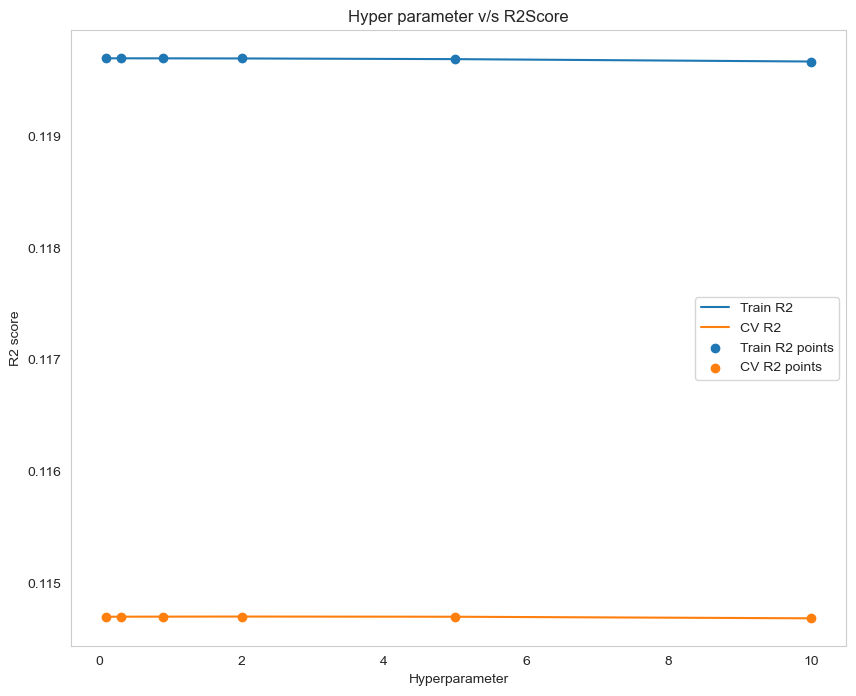

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.01,0.01,0.00,0.00,0.10,{'alpha': 0.1},0.12,0.12,0.08,0.12,...,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.00
1,0.01,0.01,0.00,0.00,0.30,{'alpha': 0.3},0.12,0.12,0.08,0.12,...,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.00
2,0.00,0.00,0.00,0.00,0.90,{'alpha': 0.9},0.12,0.12,0.08,0.12,...,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.00
3,0.01,0.01,0.00,0.00,2,{'alpha': 2},0.12,0.12,0.08,0.12,...,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.00
4,0.01,0.01,0.00,0.00,5,{'alpha': 5},0.12,0.12,0.08,0.12,...,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.12,0.00


In [149]:
results_set = pd.DataFrame.from_dict(ridge_grid.cv_results_)#creating a dataframe of results_set which will hold the cv_results value 
results_set = results_set.sort_values(['param_alpha'])
train_r2_score= results_set['mean_train_score'] 
cv_r2_score = results_set['mean_test_score'] 
alpha_set = results_set['param_alpha']

#plot the graph of train_r2 and cv_r2
plt.figure(figsize=(10,8))
plt.plot(alpha_set, train_r2_score, label='Train R2')
plt.plot(alpha_set, cv_r2_score, label='CV R2')
plt.scatter(alpha_set, train_r2_score, label='Train R2 points') 
plt.scatter(alpha_set, cv_r2_score, label='CV R2 points')
plt.legend() 
plt.xlabel("Hyperparameter")
plt.ylabel("R2 score")
plt.title("Hyper parameter v/s R2Score") 
plt.grid() 
plt.show()
results_set.head()


In [150]:
def check_performance(model):
    print("Train_R_squared =",model.best_estimator_.score(X_tr, y_train)) 
    print("Test_R_squared =", model.best_estimator_.score(X_te, y_test))  
    print("RMSE_train =", np.sqrt(mean_squared_error(y_train, model.best_estimator_.predict(X_tr))))
    print("RMSE_test = ", np.sqrt(mean_squared_error(y_test, model.best_estimator_.predict(X_te))))
    print("MAPE_train =", MAPE_calculation(y_train, model.best_estimator_.predict(X_tr)))
    print("MAPE_test = ", MAPE_calculation(y_test, model.best_estimator_.predict(X_te)))

    return model.best_estimator_.score(X_tr, y_train),model.best_estimator_.score(X_te, y_test),MAPE_calculation(y_train,model.best_estimator_.predict(X_tr)),MAPE_calculation(y_test, model.best_estimator_.predict(X_te))

In [151]:
Ridge_R2_train_g,Ridge_R2_test_g,Ridge_MAPE_train_g,Ridge_MAPE_test_g=check_performance(ridge_grid)

Train_R_squared = 0.11961896590259591


NameError: name 'X_te' is not defined

In [152]:
#LASSO Regression
param_grid = {'alpha':np.logspace(-3,3)}
lasso = Lasso(random_state=23)
lasso_random = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, cv = 10,return_train_score=True)
lasso_random.fit(X_tr,y_train)
Lasso_hyper_random=lasso_random.best_params_
print("The best hyperparameter is {} with score of {}".format(Lasso_hyper_random,lasso_random.best_score_))

The best hyperparameter is {'alpha': 14.563484775012444} with score of 0.1149140634972258


In [ ]:
%%time
#param_grid={'alpha':np.logspace(-4,3)}
param_grid = {'alpha':[0.001, 0.002, 0.9,2,5,10]}

lasso_g=Lasso(random_state=23)
lasso_grid=GridSearchCV(estimator = lasso_g,param_grid=param_grid, cv = 10,return_train_score=True)
lasso_grid.fit(X_tr,y_train)
Lasso_hyper_grid=lasso_grid.best_params_
print("The best hyperparameter is {} with score of {}".format(Lasso_hyper_grid,lasso_grid.best_score_))

In [ ]:
results_set = pd.DataFrame.from_dict(lasso_grid.cv_results_)#creating a dataframe of results_set which will hold the cv_results value 
results_set = results_set.sort_values(['param_alpha'])
train_r2_score= results_set['mean_train_score'] 
cv_r2_score = results_set['mean_test_score'] 
alpha_set = results_set['param_alpha']

#plot the graph of train_r2 and cv_r2
plt.figure(figsize=(10,8))
plt.plot(alpha_set, train_r2_score, label='Train R2')
plt.plot(alpha_set, cv_r2_score, label='CV R2')
plt.scatter(alpha_set, train_r2_score, label='Train R2 points') 
plt.scatter(alpha_set, cv_r2_score, label='CV R2 points')
plt.legend() 
plt.xlabel("Hyperparameter")
plt.ylabel("R2 score")
plt.title("Hyper parameter v/s R2Score") 
plt.grid() 
plt.show()
results_set.head()


In [ ]:
Lasso_R2_train_g,Lasso_R2_test_g,Lasso_MAPE_train_g,Lasso_MAPE_test_g=check_performance(lasso_grid)

In [ ]:
# Random Forest
from sklearn.ensemble import RandomForestRegressor
rf_model=RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, Y_train)
Y_rf_pred = rf_model.predict(X_test)

# Metrics for Random Forest
rf_mse = mean_squared_error(Y_test, Y_rf_pred)
rf_rmse = np.sqrt(rf_mse)
rf_mae = mean_absolute_error(Y_test, Y_rf_pred)
rf_r2 = r2_score(Y_test, Y_rf_pred)

print("Random Forest:")
print(f"Mean Squared Error: {rf_mse}")
print(f"Root Mean Squared Error: {rf_rmse}")
print(f"Mean Absolute Error: {rf_mae}")
print(f"R-squared Score: {rf_r2}")

# Get feature importances from the trained model
feature_importance = rf_model.feature_importances_

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Random Forest)')
plt.show()

# Visualize predictions vs. actual values for Random Forest
plt.figure(figsize=(8, 5))
# Plotting actual values
sns.scatterplot(x=Y_test, y=Y_test, label='Actual Values', color='blue', alpha=0.5)
# Plotting predicted values
sns.scatterplot(x=Y_test, y=Y_rf_pred, label='Predicted Values', color='red', alpha=0.5)
plt.title('Random Forest - Predictions vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:

# Decision Tree
from sklearn.tree import DecisionTreeRegressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, Y_train)
Y_dt_pred = dt_model.predict(X_test)

# Metrics for Decision Tree
dt_mse = mean_squared_error(Y_test, Y_dt_pred)
dt_rmse = np.sqrt(dt_mse)
dt_mae = mean_absolute_error(Y_test, Y_dt_pred)
dt_r2 = r2_score(Y_test, Y_dt_pred)

print("Decision Tree:")
print(f"Mean Squared Error: {dt_mse}")
print(f"Root Mean Squared Error: {dt_rmse}")
print(f"Mean Absolute Error: {dt_mae}")
print(f"R-squared Score: {dt_r2}")

feature_importance = dt_model.feature_importances_

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Decision Tree)')
plt.show()


In [ ]:
# Visualize feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Decision Tree)')
plt.show()

# Visualize predictions vs. actual values for Decision Tree
plt.figure(figsize=(8, 5))
# Plotting actual values
sns.scatterplot(x=Y_test, y=Y_test, label='Actual Values', color='blue', alpha=0.5)
# Plotting predicted values
sns.scatterplot(x=Y_test, y=Y_dt_pred, label='Predicted Values', color='red', alpha=0.5)
plt.title('Decision Tree - Predictions vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, Y_train)
Y_gb_pred = gb_model.predict(X_test)

# Metrics for Gradient Boosting
gb_mse = mean_squared_error(Y_test, Y_gb_pred)
gb_rmse = np.sqrt(gb_mse)
gb_mae = mean_absolute_error(Y_test, Y_gb_pred)
gb_r2 = r2_score(Y_test, Y_gb_pred)

print("Gradient Boosting:")
print(f"Mean Squared Error: {gb_mse}")
print(f"Root Mean Squared Error: {gb_rmse}")
print(f"Mean Absolute Error: {gb_mae}")
print(f"R-squared Score: {gb_r2}")

# Get feature importances from the trained model
feature_importance = gb_model.feature_importances_

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Gradient Boosting)')
plt.show()

In [ ]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create SVR model
svr_model = SVR()
svr_model.fit(X_train_scaled, Y_train)

# Predict using the SVR model
Y_svr_pred = svr_model.predict(X_test_scaled)

# Metrics for SVR
svr_mse = mean_squared_error(Y_test, Y_svr_pred)
svr_rmse = np.sqrt(svr_mse)
svr_mae = mean_absolute_error(Y_test, Y_svr_pred)
svr_r2 = r2_score(Y_test, Y_svr_pred)

print("Support Vector Regressor:")
print(f"Mean Squared Error: {svr_mse}")
print(f"Root Mean Squared Error: {svr_rmse}")
print(f"Mean Absolute Error: {svr_mae}")
print(f"R-squared Score: {svr_r2}")

# Visualize predictions vs. actual values for SVR
plt.figure(figsize=(8, 5))
# Plotting actual values
sns.scatterplot(x=Y_test, y=Y_test, label='Actual Values', color='blue', alpha=0.5)
# Plotting predicted values
sns.scatterplot(x=Y_test, y=Y_svr_pred, label='Predicted Values', color='green', alpha=0.5)
plt.title('Support Vector Regressor - Predictions vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
# Instantiate the KNN Regressor model
knn_model = KNeighborsRegressor(n_neighbors=5)  # You can adjust the number of neighbors (k) as needed

# Train the model
knn_model.fit(X_train, Y_train)

# Predictions on the test set
Y_knn_pred = knn_model.predict(X_test)

# Metrics for KNN
knn_mse = mean_squared_error(Y_test, Y_knn_pred)
knn_rmse = np.sqrt(knn_mse)
knn_mae = mean_absolute_error(Y_test, Y_knn_pred)
knn_r2 = r2_score(Y_test, Y_knn_pred)

print("K-Nearest Neighbors:")
print(f"Mean Squared Error: {knn_mse}")
print(f"Root Mean Squared Error: {knn_rmse}")
print(f"Mean Absolute Error: {knn_mae}")
print(f"R-squared Score: {knn_r2}")

# Visualize predictions vs. actual values for KNN
plt.figure(figsize=(8, 5))
# Plotting actual values
sns.scatterplot(x=Y_test, y=Y_test, label='Actual Values', color='blue', alpha=0.5)
# Plotting predicted values
sns.scatterplot(x=Y_test, y=Y_knn_pred, label='Predicted Values', color='red', alpha=0.5)
plt.title('K-Nearest Neighbors - Predictions vs Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()
     

Conclusion
After evaluating six machine learning algorithms on the provided dataset, Random Forest and Gradient Boosting emerged as the top-performing models based on key metrics:

1)Linear Regression:
Mean Squared Error: 2098749.863484956
Root Mean Squared Error: 1448.7062723288514
Mean Absolute Error: 1121.8516297020822
R-squared Score: 0.9809045125374797

Lasso Regression:
Mean Squared Error: 2099274.4461058103
Root Mean Squared Error: 1448.8873131150713
Mean Absolute Error: 1121.9150828979914
R-squared Score: 0.9808997396195471

Ridge Regression:
Mean Squared Error: 2098757.843358652
Root Mean Squared Error: 1448.7090264641317
Mean Absolute Error: 1121.8525693718934
R-squared Score: 0.9809044399325539



2)Support Vector Regression:
Support Vector Regressor:
Mean Squared Error: 107076054.56935987
Root Mean Squared Error: 10347.756016130254
Mean Absolute Error: 8307.763091717337
R-squared Score: 0.025767913966559197

These algorithms demonstrated superior predictive accuracy, with lower MSE, RMSE, and MAE values, and higher R-squared scores compared to other models such as Linear Regression, Lasso Regression, Ridge Regression, Decision Tree, and K-Nearest Neighbors